## Lane C from 4/2022
7/27/2023 - Data generated from Lentimix Library run 1 from 4/2022
Run on 6 lanes, using Library2
Analyze global run on cellranger v6 data and create h5_ad files for further analysis

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

import math
import matplotlib

import anndata
from pathlib import Path

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/3482209352.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
Path("./write").mkdir(parents=True, exist_ok=True) # write h5ad here

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
np.random.seed(1573)   #fix so we can reproduce later
sc.settings.n_jobs=4

scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.5 numpy==1.26.3 scipy==1.12.0 pandas==2.2.0 scikit-learn==1.1.3 statsmodels==0.14.1 igraph==0.11.3 pynndescent==0.5.11


In [4]:
library = ["1660-Fosl2.752","1661-Fhl2.467","1663-Myc.989","1665-Yap1.735","1667-Atf4.1383","1671-Nfkb2.152",
           "1673-Relb.286","1676-Onecut2.2361","1811-Itga2.672","1999-Cldn4-951","2114-Lif.1890",
           "2115-Fosl1.1401","2118-Nfkb1.3737",'shRenilla']

In [5]:
tags = ["shRenilla_TGTCTAGT", "shRenilla_CATAGTCA", "shPatch_GTACTTGC", "shPatch_CCATTACT", 
        "1660-Fosl2.752_CGGGAATG", "1661-Fhl2.467_GCCTACGT", "1663-Myc.989_CTGAATCT",  "1665-Yap1.735_CGTTAGGG",
        "1667-Atf4.1383_TCTGGGGC", "1671-Nfkb2.152_CGTTCAAG", "1673-Relb.286_ACAGAGCC", 
        "1676-Onecut2.2361_TTAATTAG", "1811-Itga2.672_GCCAATCG", "1999-Cldn4-951_CGTTTCCT", 
        "2114-Lif.1890_ACACGTGA", "2115-Fosl1.1401_GGTAGGGA", "2118-Nfkb1.3737_CAGTGCAT"]

In [6]:
targetGenes = ['Fosl2', 'Fhl2', 'Myc', 'Yap1', 'Atf4', 'Nfkb2', 'Relb', 'Onecut2', 'Itga2', 'Cldn4', 'Lif', 'Fosl1', 'Nfkb1', 'Slc4a11', 'Tigit']

In [7]:
results_file = 'write/allmice.h5ad'  # the file that will store the analysis results

In [8]:
adata = sc.read_10x_h5('Lib1_LaneC_filtered_feature_bc_matrix.h5', gex_only=False)

reading Lib1_LaneC_filtered_feature_bc_matrix.h5
 (0:00:01)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/anndata/_core/anndata.py:1908: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [9]:
adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [10]:
samples = list(adata[:,adata.var['feature_types']=='Antibody Capture'].var.index)

In [11]:
print(samples)

['AM1062_B0301', 'AM1073_B0302', 'AO1290_B0303', 'AM1817_B0304', 'AO1372_B0305', 'AN1975_B0306']


In [12]:
# Now filter out barcodes
hashadata = adata[:,samples]
adata = adata[:,[y for y in adata.var_names if y not in samples]]

In [13]:
hashadata.var

,gene_ids,feature_types,genome
AM1062_B0301,AM1062,Antibody Capture,
AM1073_B0302,AM1073,Antibody Capture,
AO1290_B0303,AO1290,Antibody Capture,
AM1817_B0304,AM1817,Antibody Capture,
AO1372_B0305,AO1372,Antibody Capture,
AN1975_B0306,AN1975,Antibody Capture,


## Preprocessing

Show those genes that yield the highest fraction of counts in each single cell, across all cells.

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


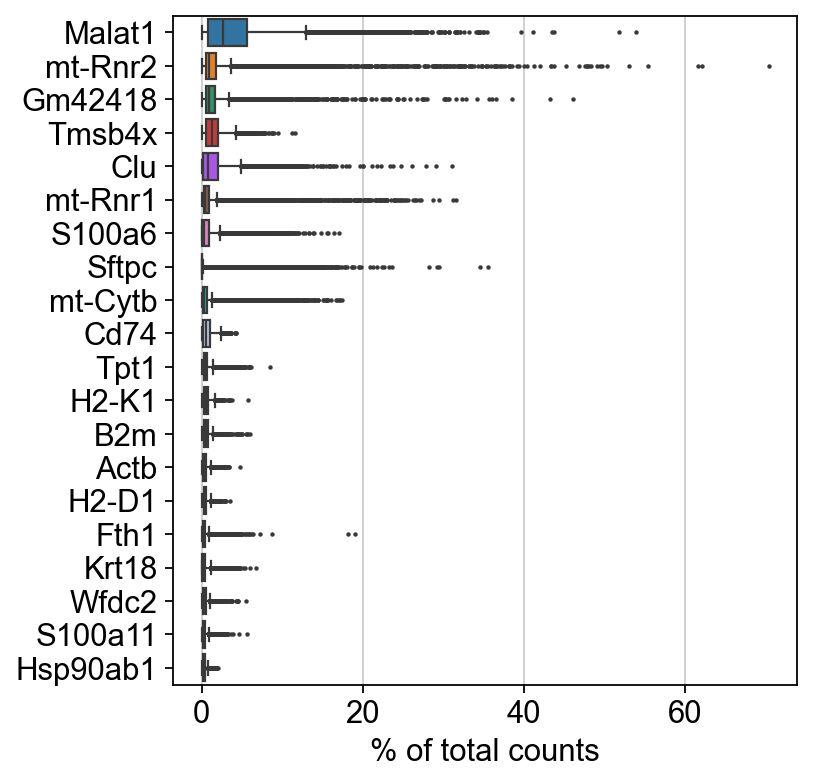

In [14]:
sc.pl.highest_expr_genes(adata, n_top=20, )

Basic filtering:

In [15]:
sc.pp.filter_cells(adata, min_genes=300)
sc.pp.filter_genes(adata, min_cells=3)
#sc.pp.filter_cells(adata, min_counts=1500)

filtered out 258 cells that have less than 300 genes expressed
filtered out 29613 genes that are detected in less than 3 cells


In [16]:
adata.var['mt'] = adata.var_names.str.startswith('mt-') # annotate the group of mitochondrial genes as 'MT'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

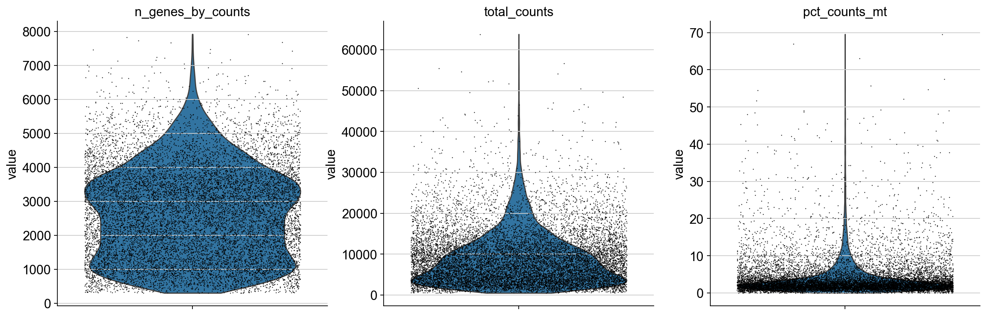

In [17]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, rotation=90)

(array([   6.,   12.,   84.,  308.,  619., 1704., 4823., 4726.,  917.,
          27.]),
 array([0.68900486, 0.71669992, 0.74439498, 0.77209004, 0.79978511,
        0.82748017, 0.85517523, 0.8828703 , 0.91056536, 0.93826042,
        0.96595548]),
 <BarContainer object of 10 artists>)

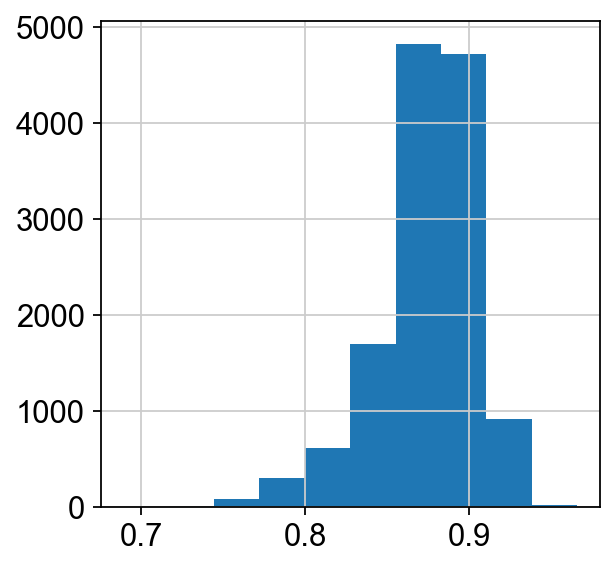

In [18]:
adata.obs["log10GenesPerUMI"] = adata.obs['n_genes_by_counts'].apply(math.log10) / adata.obs['total_counts'].apply(math.log10)
matplotlib.pyplot.hist(adata.obs["log10GenesPerUMI"])

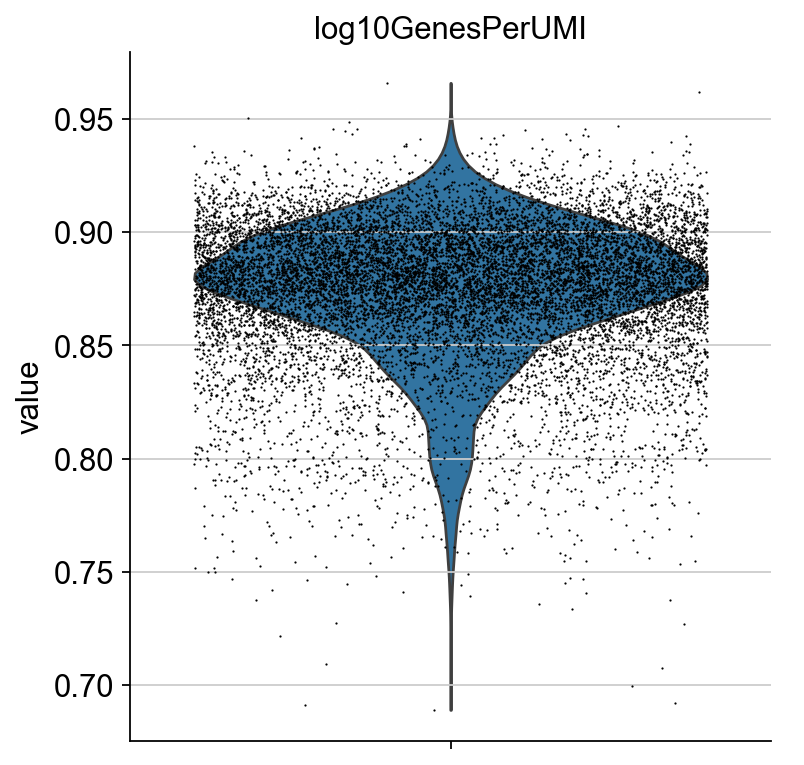

In [19]:
sc.pl.violin(adata, ['log10GenesPerUMI'],
             jitter=0.4, multi_panel=True, rotation=90)
#99% seems like a good Human pct count cutoff

Keep singlets, remove cells that have too many mouse reads, or mitochondrial genes expressed or too many total counts:

In [20]:
#Filter by Log10GenesPerUMI
adata = adata[adata.obs.log10GenesPerUMI >= 0.8,:]

In [21]:
#adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt <= 10, :]

## Run Demultiplexing

In [22]:
hashadata = hashadata[hashadata.obs.index.isin(adata.obs.index), :]

In [23]:
hashCounts = pd.DataFrame(hashadata.X.todense(), columns=hashadata.var_names, index=adata.obs.index)

In [24]:
hashDisc = hashCounts.describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,0.99,0.999])
hashDisc

,AM1062_B0301,AM1073_B0302,AO1290_B0303,AM1817_B0304,AO1372_B0305,AN1975_B0306
count,11845.000000,11845.000000,11845.000000,11845.000000,11845.000000,11845.000000
mean,279.074371,2509.531738,275.978882,35.748585,211.702148,411.375854
std,869.231445,3256.402832,1475.451538,472.877167,800.435547,1373.506592
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10%,2.000000,33.000000,1.000000,0.000000,1.000000,3.000000
20%,3.000000,42.000000,2.000000,0.000000,2.000000,4.000000
30%,4.000000,53.000000,3.000000,0.000000,2.000000,6.000000
40%,5.000000,81.000000,4.000000,0.000000,3.000000,7.000000
50%,6.000000,1250.000000,5.000000,1.000000,4.000000,8.000000
60%,7.000000,2472.400000,5.000000,1.000000,5.000000,10.000000


In [25]:
hashIDs = hashCounts.copy()
hashID = hashadata.var_names
for hashName in hashadata.var_names:
    print(hashName)
    print(hashDisc.loc["90%",hashName])
    hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
hashIDs

AM1062_B0301
957.0
AM1073_B0302
6756.800000000003
AO1290_B0303
15.0
AM1817_B0304
2.0
AO1372_B0305
310.60000000000036
AN1975_B0306
1112.800000000001


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/2942643048.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False  True ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/2942643048.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/2942643048.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise 

,AM1062_B0301,AM1073_B0302,AO1290_B0303,AM1817_B0304,AO1372_B0305,AN1975_B0306
AAACCCAAGAGGTCAC-1,False,False,True,False,False,False
AAACCCAAGGTTCTAC-1,False,False,False,False,False,False
AAACCCACACGACGCT-1,True,False,False,False,False,False
AAACCCAGTAGTGATA-1,True,False,False,False,False,False
AAACCCAGTTAGGCCC-1,False,True,False,False,False,False
...,...,...,...,...,...,...
TTTGTTGGTTAAACAG-1,True,False,False,False,False,False
TTTGTTGTCAGACTGT-1,False,False,False,True,False,False
TTTGTTGTCGAAGAAT-1,False,False,False,False,False,False
TTTGTTGTCGACATTG-1,False,False,False,False,False,False


In [26]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [27]:
from matplotlib import pyplot as plt

In [28]:
plt.rcParams['figure.figsize'] = (4,4)

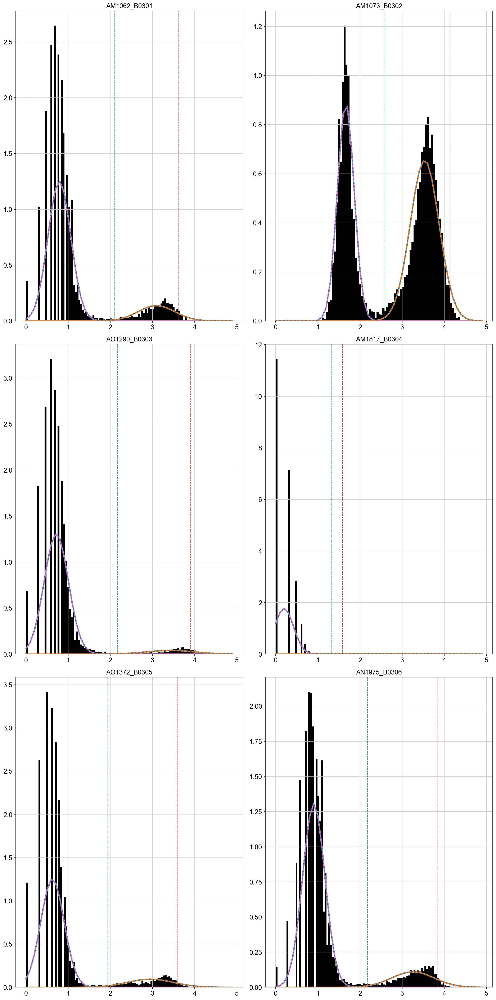

In [29]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)
from scipy.stats import norm
from sklearn.mixture import GaussianMixture as GMM
import matplotlib as mpl

fig, axs = plt.subplots(3,2, figsize =(15, 30))
dfHashBoundry = pd.DataFrame(np.zeros(len(hashadata.var_names)),hashadata.var_names, columns=["boundry"])
#gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[0.1],[4]])
binEx = np.arange(0,5,5/1000).reshape(-1,1)

for i, hashName in enumerate(hashadata.var_names):
    hashCount = np.array(np.log10(hashCounts[hashName]+1)).reshape(-1, 1)
    gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, weights_init=[0.9,0.1], means_init=[[2],[4]])
    fitGMM = gmm.fit(hashCount)
    mean = fitGMM.means_  
    covs  = fitGMM.covariances_
    weights = fitGMM.weights_

    fitGmmBound = fitGMM.predict(binEx)
    hashBoundary = False # look for where the transition starts
    if fitGmmBound[0] == 0:
        if np.where(fitGmmBound == 1)[0].size == 0:
            #set hashBoundry to naiveBoundry if there is no second Gaussian
            hashBoundry = np.log10(int(hashDisc.loc["99%",hashName])+1)
        else:
            #hashBoundry = binEx[np.where(fitGmmBound == 1)[0][0]][0]            
            hashBoundry = binEx[(np.where(fitGMM.predict_proba(binEx)[:,1] > .99) and np.where(fitGMM.predict_proba(binEx)[:,0] < 1e-3))[0][0]][0]
            #print(np.where(fitGMM.predict_proba(binEx)[:,1] > .99)[0][0])
           
    else:
        count = False
        for x in range(0,len(fitGmmBound)):
            if not count and fitGmmBound[x] != 0:
                continue
            elif fitGmmBound[x] == 0:
                count = x
            elif count and fitGmmBound[x] == 1 and fitGMM.predict_proba(binEx)[x][1] > .99 and fitGMM.predict_proba(binEx)[x][0] < 1e-3:
                hashBoundry = binEx[x][0]
                #pdb.set_trace()
                break
    naiveBoundry = np.log10(int(hashDisc.loc["99%",hashName])+1)
    
    dfHashBoundry.loc[hashName] = hashBoundry
    
    x_axis = np.arange(0, 5, 0.1)
    y_axis0 = norm.pdf(x_axis, float(mean[0][0]), np.sqrt(float(covs[0][0][0])))*weights[0] # 1st gaussian
    y_axis1 = norm.pdf(x_axis, float(mean[1][0]), np.sqrt(float(covs[1][0][0])))*weights[1] # 2nd gaussian

    # Plot 2
    axs[i//2,i%2].set_title(hashName)
    axs[i//2,i%2].axvline(hashBoundry, c='C2', linestyle='dashed', linewidth=1)  #green #test making it stricter
    axs[i//2,i%2].axvline(naiveBoundry, c='C3', linestyle='dashed', linewidth=1) #red
    axs[i//2,i%2].hist(hashCount, density=True, color='black', bins=100)        
    axs[i//2,i%2].plot(x_axis, y_axis0, lw=3, c='C6')                            #pink
    axs[i//2,i%2].plot(x_axis, y_axis1, lw=3, c='C1')                            #orange
    axs[i//2,i%2].plot(x_axis, y_axis0+y_axis1, lw=3, c='C0', ls=':')            #dotted blue
    
plt.tight_layout(pad=1.0)
#plt.rcParams["figure.figsize"] = (20,5)
plt.show()

In [30]:
#dfHashBoundry += 0.1
dfHashBoundry

,boundry
AM1062_B0301,2.105
AM1073_B0302,2.590
AO1290_B0303,2.175
AM1817_B0304,1.320
AO1372_B0305,1.940
AN1975_B0306,2.175


In [31]:
hashCounts

,AM1062_B0301,AM1073_B0302,AO1290_B0303,AM1817_B0304,AO1372_B0305,AN1975_B0306
AAACCCAAGAGGTCAC-1,6.0,52.0,3941.0,1.0,8.0,5.0
AAACCCAAGGTTCTAC-1,3.0,28.0,14.0,0.0,4.0,4.0
AAACCCACACGACGCT-1,1681.0,41.0,2.0,1.0,8.0,8.0
AAACCCAGTAGTGATA-1,3019.0,101.0,3.0,1.0,11.0,7.0
AAACCCAGTTAGGCCC-1,5.0,8908.0,3.0,2.0,6.0,8.0
...,...,...,...,...,...,...
TTTGTTGGTTAAACAG-1,2248.0,42.0,5.0,0.0,2.0,22.0
TTTGTTGTCAGACTGT-1,6.0,40.0,3.0,2228.0,2.0,3.0
TTTGTTGTCGAAGAAT-1,4.0,4949.0,0.0,0.0,2.0,6.0
TTTGTTGTCGACATTG-1,2.0,5881.0,5.0,1.0,0.0,4.0


In [32]:
hashIDs = hashCounts.copy()
hashID = hashadata.var_names
for hashName in hashadata.var_names:
    print(hashName)
    print(dfHashBoundry.loc[hashName].values[0])
    hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
#hashIDs.loc[:,'AT1129_B0304_2117'] = False
#hashIDs.loc[:,'AT1606_B0305_Renilla'] = False
#hashIDs.loc[:,'AT1831_B0306_2117'] = False
#hashIDs.loc[:,'AT1607_B0307_Renilla'] = False
#hashIDs.loc[:,'AV1189_B0310_2118'] = False
hashIDs

AM1062_B0301
2.105
AM1073_B0302
2.59
AO1290_B0303
2.1750000000000003
AM1817_B0304
1.32
AO1372_B0305
1.94
AN1975_B0306
2.1750000000000003


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/1750252066.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False  True ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/1750252066.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ...  True  True  True]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/1750252066.py:6: FutureWarning: Setting an item of incomp

,AM1062_B0301,AM1073_B0302,AO1290_B0303,AM1817_B0304,AO1372_B0305,AN1975_B0306
AAACCCAAGAGGTCAC-1,False,False,True,False,False,False
AAACCCAAGGTTCTAC-1,False,False,False,False,False,False
AAACCCACACGACGCT-1,True,False,False,False,False,False
AAACCCAGTAGTGATA-1,True,False,False,False,False,False
AAACCCAGTTAGGCCC-1,False,True,False,False,False,False
...,...,...,...,...,...,...
TTTGTTGGTTAAACAG-1,True,False,False,False,False,False
TTTGTTGTCAGACTGT-1,False,False,False,True,False,False
TTTGTTGTCGAAGAAT-1,False,True,False,False,False,False
TTTGTTGTCGACATTG-1,False,True,False,False,False,False


In [33]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [34]:
adata.obs["Classification"] = classification
hashadata.obs["Classification"] = classification
adata.obs["Classification"].value_counts()

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/4135005838.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["Classification"] = classification
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/4135005838.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  hashadata.obs["Classification"] = classification


Classification
AM1073_B0302    5955
AM1062_B0301    1420
AN1975_B0306    1234
AO1372_B0305    1185
doublet          756
negative         728
AO1290_B0303     483
AM1817_B0304      84
Name: count, dtype: int64

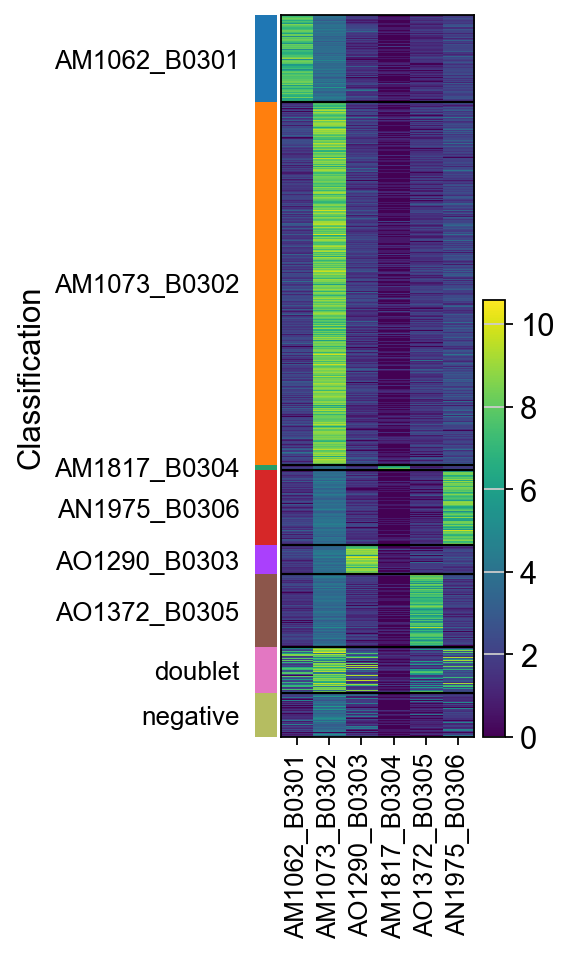

In [35]:
#output visulaization of hashing
sc.pl.heatmap(hashadata, hashadata.var_names, groupby="Classification", log=True)#, save = f"_{figName}_hash.png")

In [36]:
hashCounts = pd.DataFrame(index=adata.obs.index)

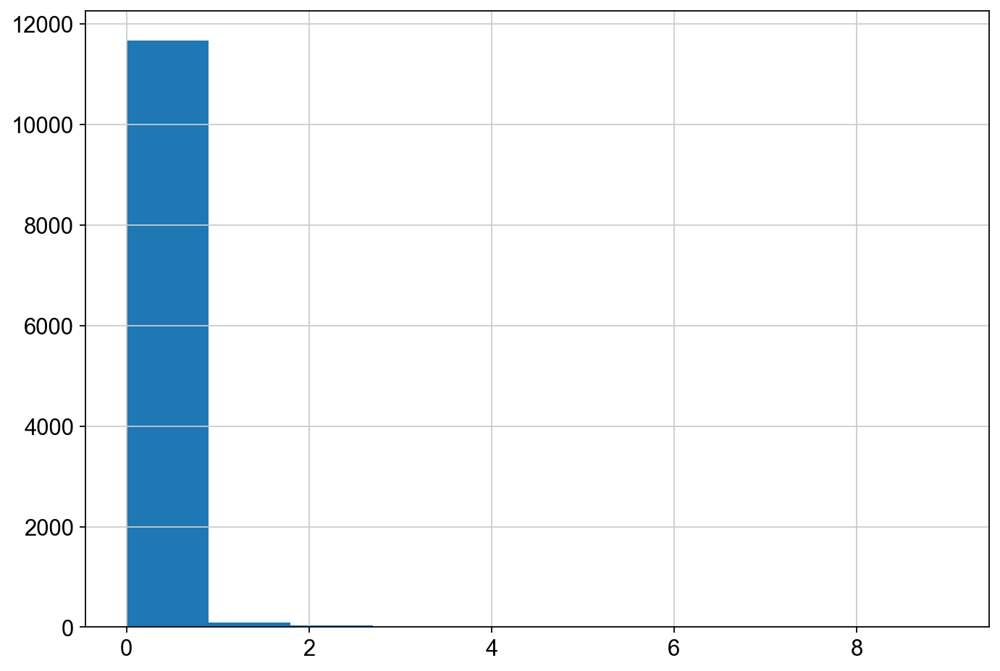

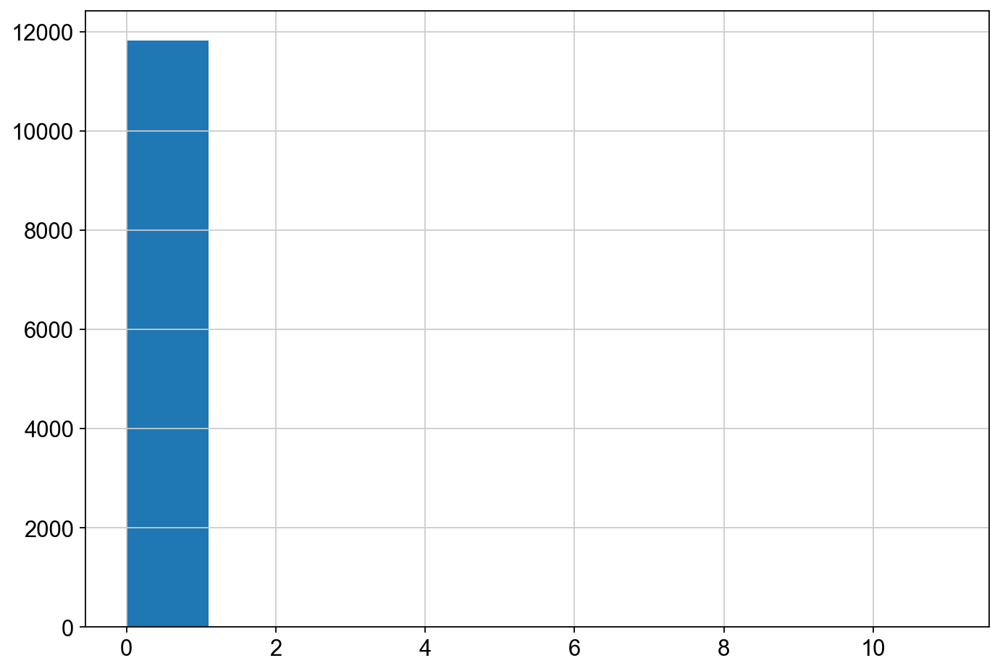

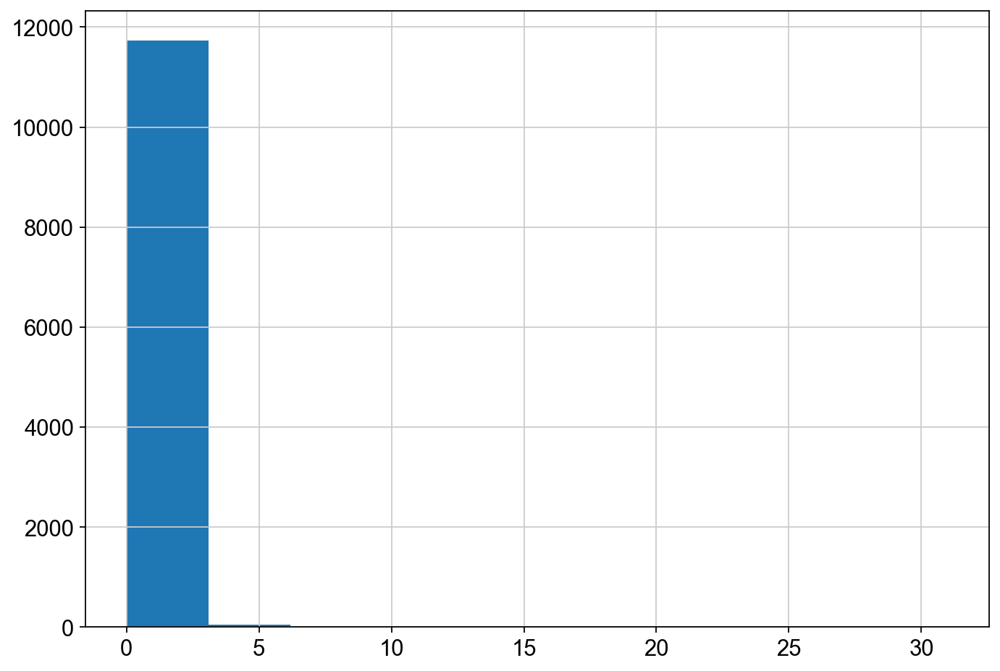

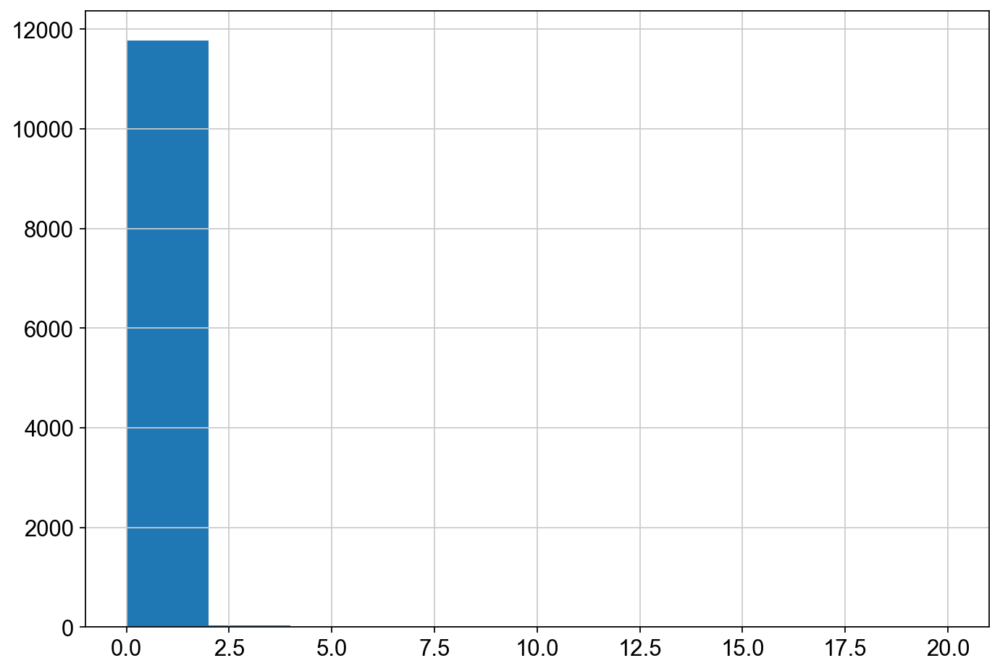

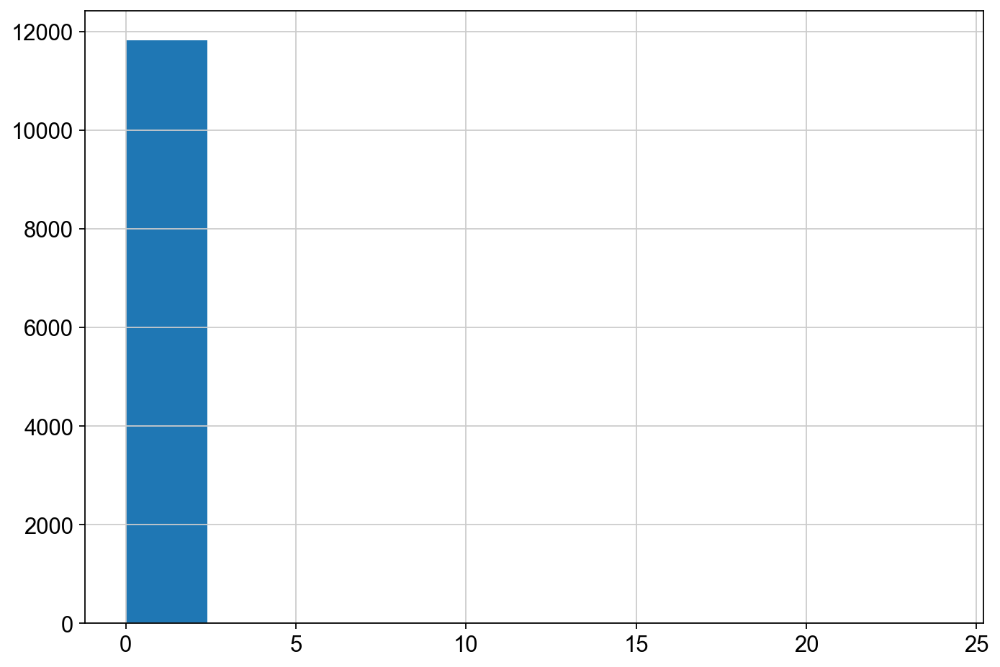

...

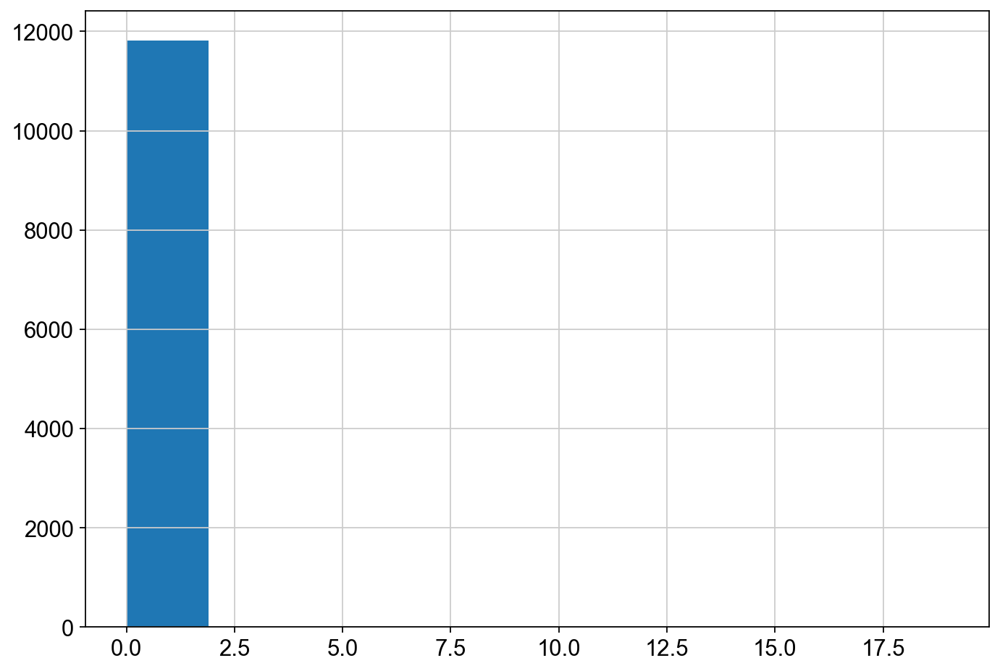

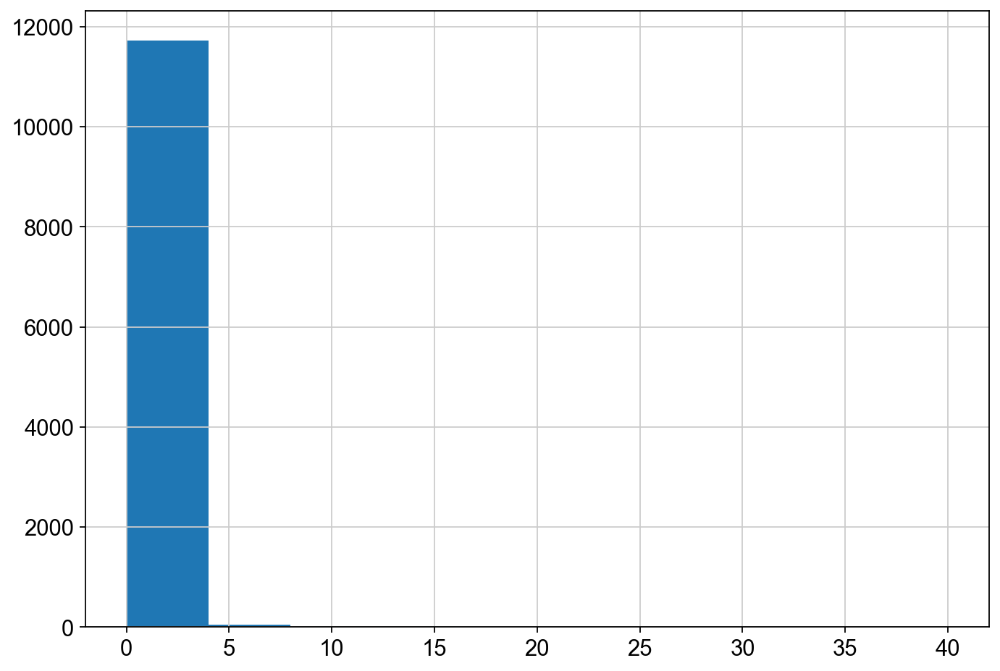

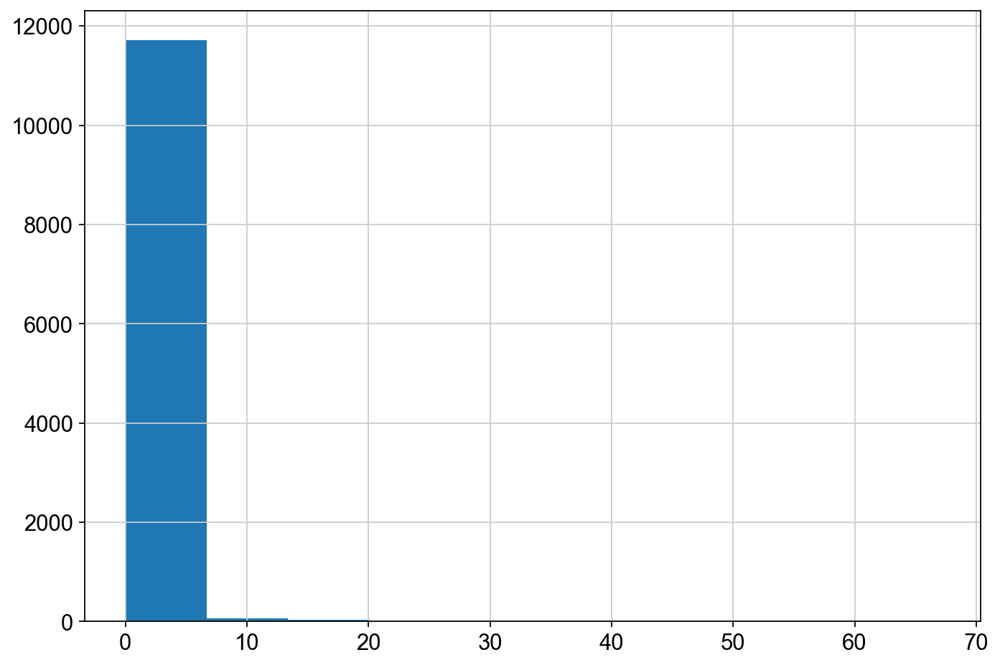

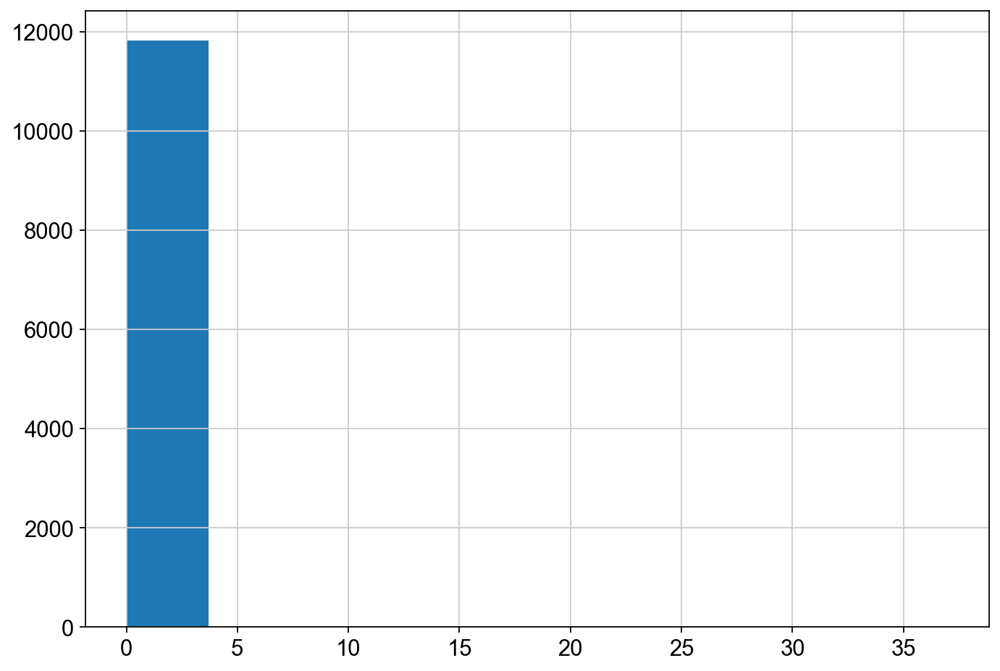

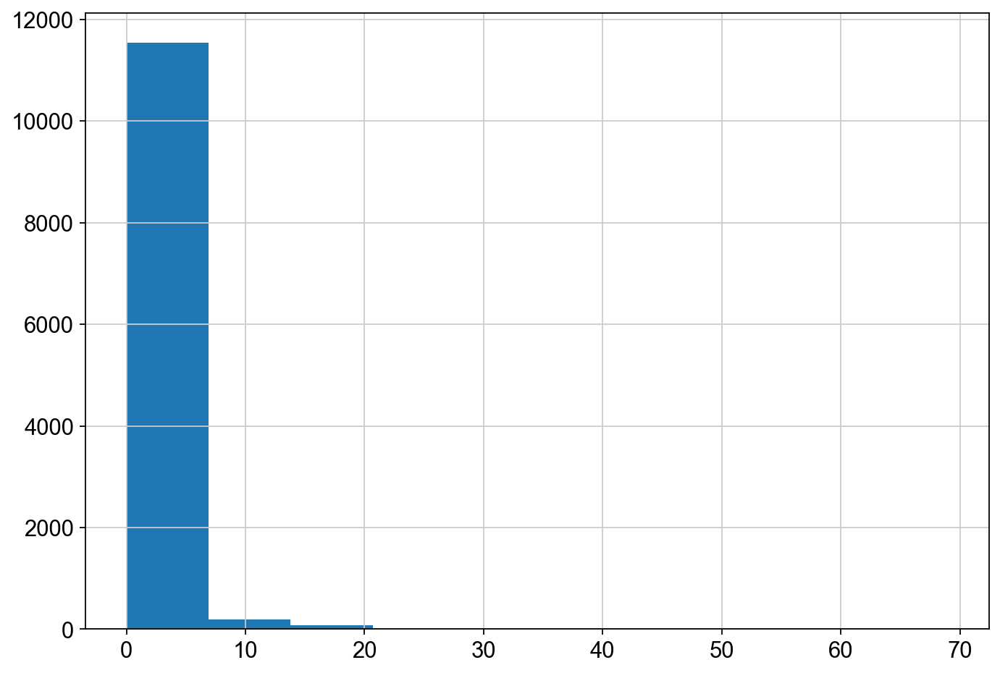

In [37]:
for x in library:
    fig, ax = plt.subplots(figsize =(10, 7))
    ax.hist(adata.X[:,adata.var.index.isin([x])].toarray())
    adata.obs["%s-library" % x] = adata.X[:,adata.var.index.isin([x])].toarray()
    hashCounts["%s-library" % x] = adata.X[:,adata.var.index.isin([x])].toarray()

In [38]:
hashCounts

,1660-Fosl2.752-library,1661-Fhl2.467-library,1663-Myc.989-library,1665-Yap1.735-library,1667-Atf4.1383-library,1671-Nfkb2.152-library,1673-Relb.286-library,1676-Onecut2.2361-library,1811-Itga2.672-library,1999-Cldn4-951-library,2114-Lif.1890-library,2115-Fosl1.1401-library,2118-Nfkb1.3737-library,shRenilla-library
AAACCCAAGAGGTCAC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCAAGGTTCTAC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCACACGACGCT-1,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCAGTAGTGATA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCAGTTAGGCCC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTTAAACAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTTGTCAGACTGT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
TTTGTTGTCGAAGAAT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTTGTCGACATTG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


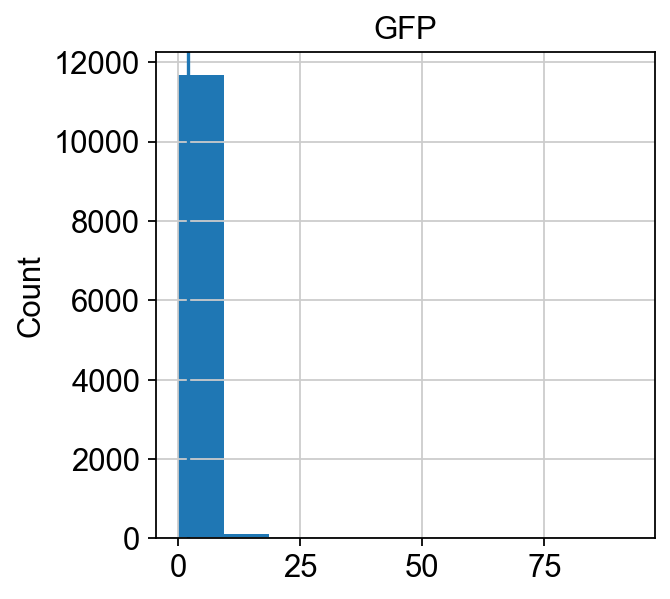

In [39]:
import matplotlib.pyplot as plt
_ = plt.hist(adata[adata.obs.index,'GFP'].X.toarray())
plt.ylabel("Count")
plt.title("GFP")
plt.axvline(x=2)
plt.show()

In [40]:
adata.obs['GFP_count'] = adata.X[:,adata.var.index.isin(['GFP'])].toarray()

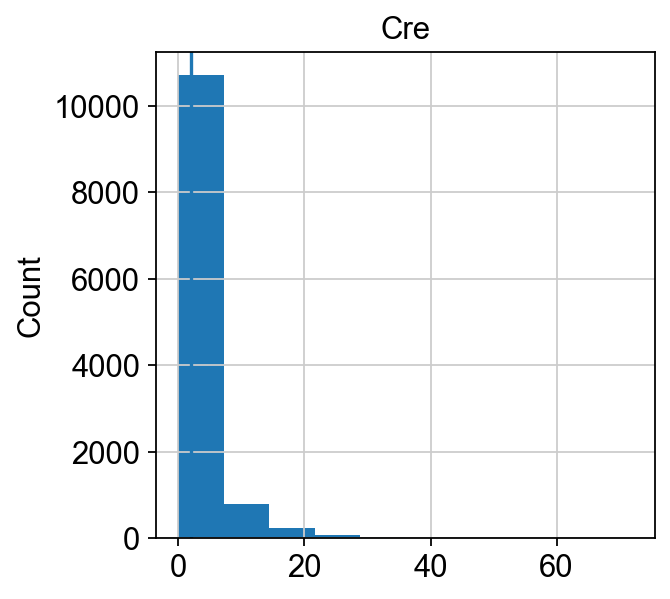

In [41]:
import matplotlib.pyplot as plt
_ = plt.hist(adata[adata.obs.index,'Cre'].X.toarray())
plt.ylabel("Count")
plt.title("Cre")
plt.axvline(x=2)
plt.show()

In [42]:
adata.obs['Cre_count'] = adata.X[:,adata.var.index.isin(['Cre'])].toarray()

## find single library read cells

In [43]:
hashIDs = hashCounts.copy()
for hashName in hashCounts.columns:
    print(hashName)
    hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] >= 2
#hashIDs.loc[:,'AT1129_B0304_2117'] = False
#hashIDs.loc[:,'AT1606_B0305_Renilla'] = False
#hashIDs.loc[:,'AT1831_B0306_2117'] = False
#hashIDs.loc[:,'AT1607_B0307_Renilla'] = False
#hashIDs.loc[:,'AV1189_B0310_2118'] = False
hashIDs

1660-Fosl2.752-library
1661-Fhl2.467-library
1663-Myc.989-library
1665-Yap1.735-library
1667-Atf4.1383-library
1671-Nfkb2.152-library
1673-Relb.286-library
1676-Onecut2.2361-library
1811-Itga2.672-library
1999-Cldn4-951-library
2114-Lif.1890-library
2115-Fosl1.1401-library
2118-Nfkb1.3737-library
shRenilla-library


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/379750047.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] >= 2
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/379750047.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] >= 2
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/379750047.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False  True 

,1660-Fosl2.752-library,1661-Fhl2.467-library,1663-Myc.989-library,1665-Yap1.735-library,1667-Atf4.1383-library,1671-Nfkb2.152-library,1673-Relb.286-library,1676-Onecut2.2361-library,1811-Itga2.672-library,1999-Cldn4-951-library,2114-Lif.1890-library,2115-Fosl1.1401-library,2118-Nfkb1.3737-library,shRenilla-library
AAACCCAAGAGGTCAC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCAAGGTTCTAC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCACACGACGCT-1,False,False,True,False,False,False,False,False,False,False,False,False,False,False
AAACCCAGTAGTGATA-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCAGTTAGGCCC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTTAAACAG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGTCAGACTGT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGTCGAAGAAT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGTCGACATTG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [44]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashCounts.columns[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [45]:
classification

array(['negative', 'negative', '1663-Myc.989-library', ..., 'negative',
       'negative', 'negative'], dtype=object)

In [46]:
adata.obs["library_id"] = classification
adata.obs["library_id"].value_counts()

library_id
negative                     9803
shRenilla-library             586
1676-Onecut2.2361-library     345
2115-Fosl1.1401-library       239
1673-Relb.286-library         213
2114-Lif.1890-library         161
1663-Myc.989-library          141
1671-Nfkb2.152-library         87
1660-Fosl2.752-library         72
1665-Yap1.735-library          66
doublet                        28
2118-Nfkb1.3737-library        28
1999-Cldn4-951-library         26
1661-Fhl2.467-library          21
1667-Atf4.1383-library         21
1811-Itga2.672-library          8
Name: count, dtype: int64

## Prune filtered cells and run hashing on extra hashtag reads

In [47]:
adata_enriched = sc.read_10x_h5('../barcodes/C/Lib1_C_BC_enriched_filtered_feature_bc_matrix.h5')

reading ../barcodes/C/Lib1_C_BC_enriched_filtered_feature_bc_matrix.h5
 (0:00:00)


In [48]:
# Find the barcodes that exist in BOTH datasets
common_indices = adata_enriched.obs.index.intersection(adata.obs.index)

# Filter the enriched data to only include those common cells and the specific tags
adata_enriched = adata_enriched[common_indices, tags]

In [49]:
hashCounts = pd.DataFrame(adata_enriched.X.todense(), columns=adata_enriched.var_names, index=adata_enriched.obs.index)
hashDisc = hashCounts.describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,0.95,0.99,0.999])
hashCounts

,shRenilla_TGTCTAGT,shRenilla_CATAGTCA,shPatch_GTACTTGC,shPatch_CCATTACT,1660-Fosl2.752_CGGGAATG,1661-Fhl2.467_GCCTACGT,1663-Myc.989_CTGAATCT,1665-Yap1.735_CGTTAGGG,1667-Atf4.1383_TCTGGGGC,1671-Nfkb2.152_CGTTCAAG,1673-Relb.286_ACAGAGCC,1676-Onecut2.2361_TTAATTAG,1811-Itga2.672_GCCAATCG,1999-Cldn4-951_CGTTTCCT,2114-Lif.1890_ACACGTGA,2115-Fosl1.1401_GGTAGGGA,2118-Nfkb1.3737_CAGTGCAT
AAACCCACACGACGCT-1,62.0,0.0,9.0,14.0,28.0,2.0,66.0,9.0,0.0,14.0,22.0,35.0,2.0,2.0,20.0,19.0,2.0
AAACCCAGTAGTGATA-1,113.0,1.0,18.0,160.0,42.0,2.0,35.0,24.0,5.0,14.0,43.0,56.0,3.0,4.0,16.0,43.0,7.0
AAACCCAGTTAGGCCC-1,95.0,1.0,10.0,25.0,53.0,1.0,33.0,17.0,3.0,21.0,41.0,78.0,7.0,12.0,39.0,41.0,8.0
AAACCCATCAATGTCG-1,89.0,0.0,15.0,23.0,67.0,3.0,33.0,16.0,8.0,18.0,42.0,66.0,3.0,10.0,40.0,38.0,2.0
AAACCCATCACCCTTG-1,81.0,2.0,12.0,20.0,39.0,1.0,12.0,10.0,8.0,13.0,20.0,57.0,0.0,3.0,26.0,31.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTCGCAGTC-1,47.0,0.0,12.0,11.0,41.0,3.0,23.0,10.0,1.0,11.0,20.0,180.0,0.0,5.0,24.0,29.0,4.0
TTTGTTGGTTAAACAG-1,44.0,0.0,4.0,14.0,25.0,2.0,11.0,7.0,0.0,8.0,15.0,28.0,3.0,2.0,12.0,19.0,3.0
TTTGTTGTCAGACTGT-1,108.0,1.0,10.0,25.0,47.0,3.0,41.0,8.0,1.0,21.0,38.0,76.0,5.0,6.0,42.0,32.0,8.0
TTTGTTGTCGACATTG-1,53.0,0.0,7.0,15.0,25.0,3.0,16.0,10.0,3.0,11.0,23.0,37.0,1.0,4.0,23.0,24.0,4.0


In [50]:
hashIDs = hashCounts.copy()
hashID = adata_enriched.var_names
for hashName in adata_enriched.var_names:
    print(hashName)
    print(hashDisc.loc["90%",hashName])
    hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
#hashIDs

shRenilla_TGTCTAGT
150.0
shRenilla_CATAGTCA
1.0
shPatch_GTACTTGC
20.0
shPatch_CCATTACT
37.0
1660-Fosl2.752_CGGGAATG
69.0
1661-Fhl2.467_GCCTACGT
5.0
1663-Myc.989_CTGAATCT
42.0
1665-Yap1.735_CGTTAGGG
23.0
1667-Atf4.1383_TCTGGGGC
6.0
1671-Nfkb2.152_CGTTCAAG
27.0
1673-Relb.286_ACAGAGCC
54.0
1676-Onecut2.2361_TTAATTAG
102.0
1811-Itga2.672_GCCAATCG
5.0
1999-Cldn4-951_CGTTTCCT
9.0
2114-Lif.1890_ACACGTGA
44.0
2115-Fosl1.1401_GGTAGGGA
56.0
2118-Nfkb1.3737_CAGTGCAT
8.0


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/420048964.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/420048964.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/420048964.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in 

In [51]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

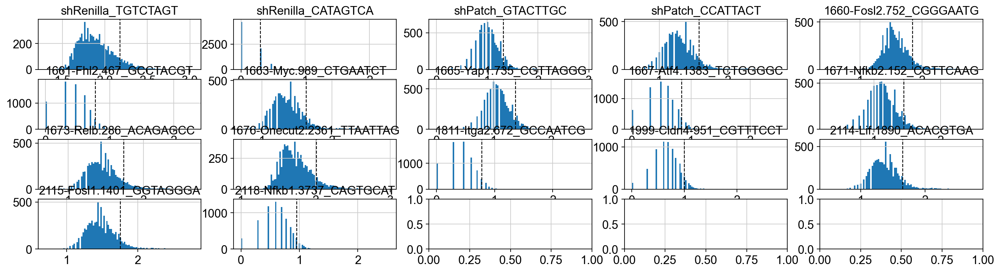

In [52]:
plt.rcParams['figure.figsize'] = (4,4)
fig, axs = plt.subplots(4,5, figsize =(20, 5))

for i, hashName in enumerate(adata_enriched.var_names):
    hashCounts2 = np.log10(hashCounts[hashName]+1)
    axs[i//5,i%5].set_title(hashName)
    axs[i//5,i%5].hist(hashCounts2, bins = 100)
    axs[i//5,i%5].axvline(np.log10(int(hashDisc.loc["90%",hashName])+1), color='k', linestyle='dashed', linewidth=1)

#plt.rcParams["figure.figsize"] = (20,5)
plt.show()

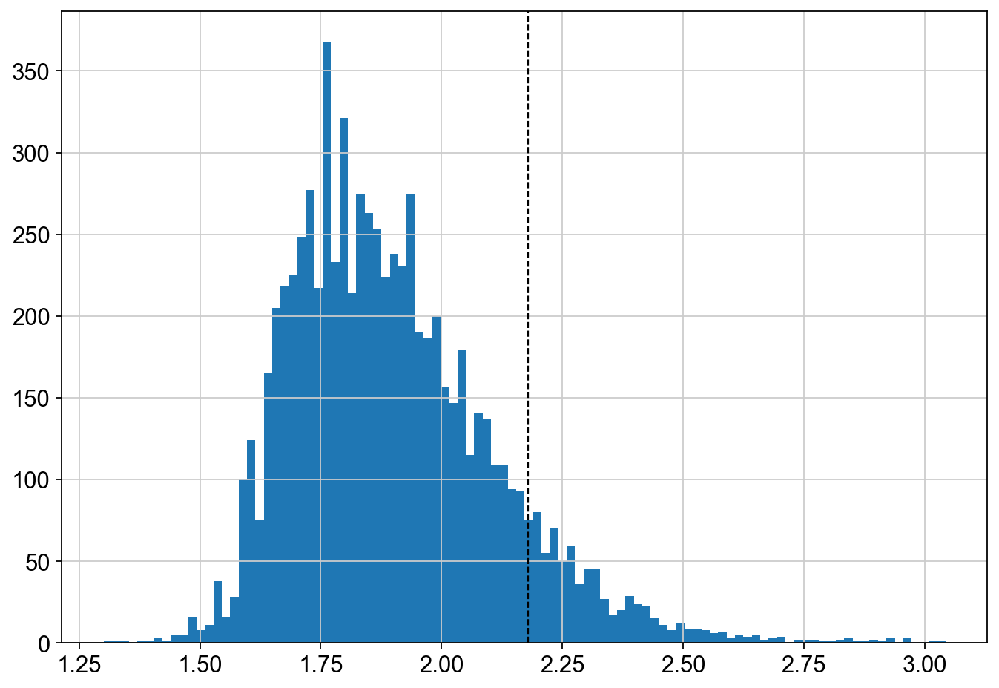

In [53]:
hashName= "shRenilla_TGTCTAGT"
hash301 = np.log10(hashCounts[hashName]+1)

fig, ax = plt.subplots(figsize =(10, 7))
ax.hist(hash301, bins = 100)
ax.axvline(np.log10(int(hashDisc.loc["90%",hashName])+1), color='k', linestyle='dashed', linewidth=1)
# Show plot
plt.show()

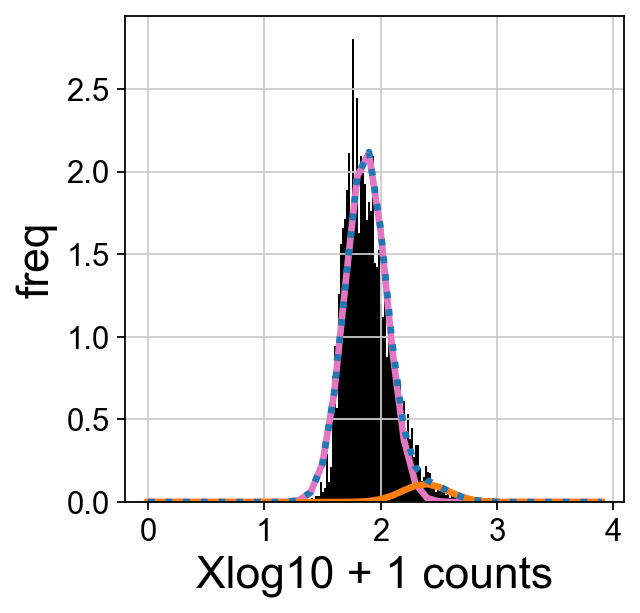

In [54]:
# import libraries (some are for cosmetics)
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)
from scipy.stats import norm
from sklearn.mixture import GaussianMixture as GMM
import matplotlib as mpl

x = np.array(hash301).reshape(-1, 1)

# create GMM model object
gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, weights_init=[0.9,0.1], means_init=[[2],[4]])

# find useful parameters
fitGMM = gmm.fit(x)
mean = fitGMM.means_  
covs  = fitGMM.covariances_
weights = fitGMM.weights_

# create necessary things to plot
x_axis = np.arange(0, 4, 0.1)
y_axis0 = norm.pdf(x_axis, float(mean[0][0]), np.sqrt(float(covs[0][0][0])))*weights[0] # 1st gaussian
y_axis1 = norm.pdf(x_axis, float(mean[1][0]), np.sqrt(float(covs[1][0][0])))*weights[1] # 2nd gaussian

ax = fig.add_subplot(1,2,2)
# Plot 2
plt.hist(x, density=True, color='black', bins=100)
plt.plot(x_axis, y_axis0, lw=3, c='C6')
plt.plot(x_axis, y_axis1, lw=3, c='C1')
plt.plot(x_axis, y_axis0+y_axis1, lw=3, c='C0', ls=':')
#plt.xlim(0, 4, 0.1)
#plt.ylim(0.0, 2.0)
plt.xlabel(r"Xlog10 + 1 counts", fontsize=20)
plt.ylabel(r"freq", fontsize=20)

#plt.subplots_adjust(wspace=0.3)
plt.show()
plt.close('all')

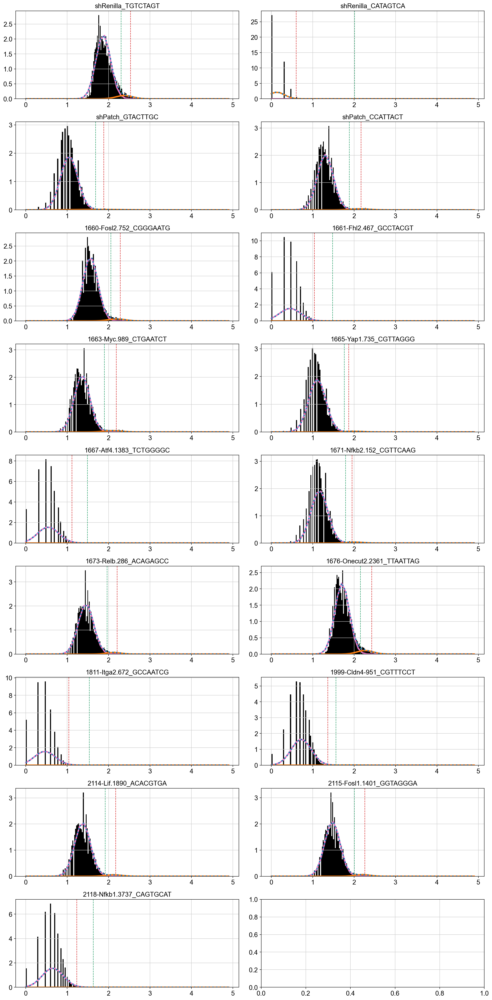

In [55]:
import pdb

fig, axs = plt.subplots(9,2, figsize =(15, 30))
dfHashBoundry = pd.DataFrame(np.zeros(len(adata_enriched.var_names)),adata_enriched.var_names, columns=["boundry"])
#gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[0.1],[4]])
binEx = np.arange(0,5,5/1000).reshape(-1,1)

for i, hashName in enumerate(adata_enriched.var_names):
    hashCount = np.array(np.log10(hashCounts[hashName]+1)).reshape(-1, 1)
    gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[2],[2.75]])
    fitGMM = gmm.fit(hashCount)
    mean = fitGMM.means_  
    covs  = fitGMM.covariances_
    weights = fitGMM.weights_

    fitGmmBound = fitGMM.predict(binEx)
    hashBoundary = False # look for where the transition starts
    if fitGmmBound[0] == 0:
        if np.where(fitGmmBound == 1)[0].size == 0:
            #set hashBoundry to naiveBoundry if there is no second Gaussian
            hashBoundry = np.log10(int(hashDisc.loc["95%",hashName])+1)
        else:
            hashBoundry = binEx[np.where(fitGmmBound == 1)[0][0]][0]            
            #hashBoundry = binEx[(np.where(fitGMM.predict_proba(binEx)[:,1] > .99) and np.where(fitGMM.predict_proba(binEx)[:,0] < 1e-3))[0][0]][0]
            #print(np.where(fitGMM.predict_proba(binEx)[:,1] > .99)[0][0])
           
    else:
        count = False
        for x in range(0,len(fitGmmBound)):
            if not count and fitGmmBound[x] != 0:
                continue
            elif fitGmmBound[x] == 0:
                count = x
            elif count and fitGmmBound[x] == 1:# and fitGMM.predict_proba(binEx)[x][1] > .99 and fitGMM.predict_proba(binEx)[x][0] < 1e-3:
                hashBoundry = binEx[x][0]
                #pdb.set_trace()
                break
#    hashBoundry = mean[0][0]+1.96*np.sqrt(float(covs[0][0][0]))
    naiveBoundry = np.log10(int(hashDisc.loc["99%",hashName])+1)
    
    dfHashBoundry.loc[hashName] = hashBoundry
    
    x_axis = np.arange(0, 5, 0.1)
    y_axis0 = norm.pdf(x_axis, float(mean[0][0]), np.sqrt(float(covs[0][0][0])))*weights[0] # 1st gaussian
    y_axis1 = norm.pdf(x_axis, float(mean[1][0]), np.sqrt(float(covs[1][0][0])))*weights[1] # 2nd gaussian

    # Plot 2
    axs[i//2,i%2].set_title(hashName)
    axs[i//2,i%2].axvline(hashBoundry, c='C2', linestyle='dashed', linewidth=1)  #green #test making it stricter
    axs[i//2,i%2].axvline(naiveBoundry, c='C3', linestyle='dashed', linewidth=1) #red
    axs[i//2,i%2].hist(hashCount, density=True, color='black', bins=100)        
    axs[i//2,i%2].plot(x_axis, y_axis0, lw=3, c='C6')                            #pink
    axs[i//2,i%2].plot(x_axis, y_axis1, lw=3, c='C1')                            #orange
    axs[i//2,i%2].plot(x_axis, y_axis0+y_axis1, lw=3, c='C0', ls=':')            #dotted blue
    
plt.tight_layout(pad=1.0)
#plt.rcParams["figure.figsize"] = (20,5)
plt.show()

In [56]:
#dfHashBoundry += 0.1
dfHashBoundry

,boundry
shRenilla_TGTCTAGT,2.305
shRenilla_CATAGTCA,2.010
shPatch_GTACTTGC,1.685
shPatch_CCATTACT,1.885
1660-Fosl2.752_CGGGAATG,2.055
1661-Fhl2.467_GCCTACGT,1.480
1663-Myc.989_CTGAATCT,1.900
1665-Yap1.735_CGTTAGGG,1.765
1667-Atf4.1383_TCTGGGGC,1.490
1671-Nfkb2.152_CGTTCAAG,1.795


In [57]:
hashIDs = hashCounts.copy()
hashID = adata_enriched.var_names
for hashName in adata_enriched.var_names:
    print(hashName)
    print(dfHashBoundry.loc[hashName].values[0])
    hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
hashIDs

shRenilla_TGTCTAGT
2.305
shRenilla_CATAGTCA
2.0100000000000002
shPatch_GTACTTGC
1.685
shPatch_CCATTACT
1.885
1660-Fosl2.752_CGGGAATG
2.055
1661-Fhl2.467_GCCTACGT
1.48
1663-Myc.989_CTGAATCT
1.9000000000000001
1665-Yap1.735_CGTTAGGG
1.7650000000000001
1667-Atf4.1383_TCTGGGGC
1.49
1671-Nfkb2.152_CGTTCAAG
1.795
1673-Relb.286_ACAGAGCC
1.965
1676-Onecut2.2361_TTAATTAG
2.15
1811-Itga2.672_GCCAATCG
1.5350000000000001
1999-Cldn4-951_CGTTTCCT
1.56
2114-Lif.1890_ACACGTGA
1.92
2115-Fosl1.1401_GGTAGGGA
2.005
2118-Nfkb1.3737_CAGTGCAT
1.6300000000000001


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/68405080.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/68405080.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/68405080.py:6: FutureWarning: Setting an item of incompatible

,shRenilla_TGTCTAGT,shRenilla_CATAGTCA,shPatch_GTACTTGC,shPatch_CCATTACT,1660-Fosl2.752_CGGGAATG,1661-Fhl2.467_GCCTACGT,1663-Myc.989_CTGAATCT,1665-Yap1.735_CGTTAGGG,1667-Atf4.1383_TCTGGGGC,1671-Nfkb2.152_CGTTCAAG,1673-Relb.286_ACAGAGCC,1676-Onecut2.2361_TTAATTAG,1811-Itga2.672_GCCAATCG,1999-Cldn4-951_CGTTTCCT,2114-Lif.1890_ACACGTGA,2115-Fosl1.1401_GGTAGGGA,2118-Nfkb1.3737_CAGTGCAT
AAACCCACACGACGCT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCAGTAGTGATA-1,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCAGTTAGGCCC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCATCAATGTCG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCATCACCCTTG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTCGCAGTC-1,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False
TTTGTTGGTTAAACAG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGTCAGACTGT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGTCGACATTG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [58]:
classification = np.empty(len(adata_enriched), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [59]:
adata_enriched.obs['Library'] = classification
adata.obs["Library"] = adata_enriched.obs['Library']
adata.obs["Library"].value_counts()

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/2727749959.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_enriched.obs['Library'] = classification


Library
negative                      5878
1676-Onecut2.2361_TTAATTAG     223
shRenilla_TGTCTAGT             211
doublet                        156
1660-Fosl2.752_CGGGAATG        143
1673-Relb.286_ACAGAGCC         142
2115-Fosl1.1401_GGTAGGGA       128
1663-Myc.989_CTGAATCT          125
2114-Lif.1890_ACACGTGA         125
shPatch_CCATTACT                99
1671-Nfkb2.152_CGTTCAAG         80
1665-Yap1.735_CGTTAGGG          63
shPatch_GTACTTGC                63
1999-Cldn4-951_CGTTTCCT         34
2118-Nfkb1.3737_CAGTGCAT        21
1661-Fhl2.467_GCCTACGT          16
1667-Atf4.1383_TCTGGGGC         16
1811-Itga2.672_GCCAATCG         11
shRenilla_CATAGTCA               1
Name: count, dtype: int64

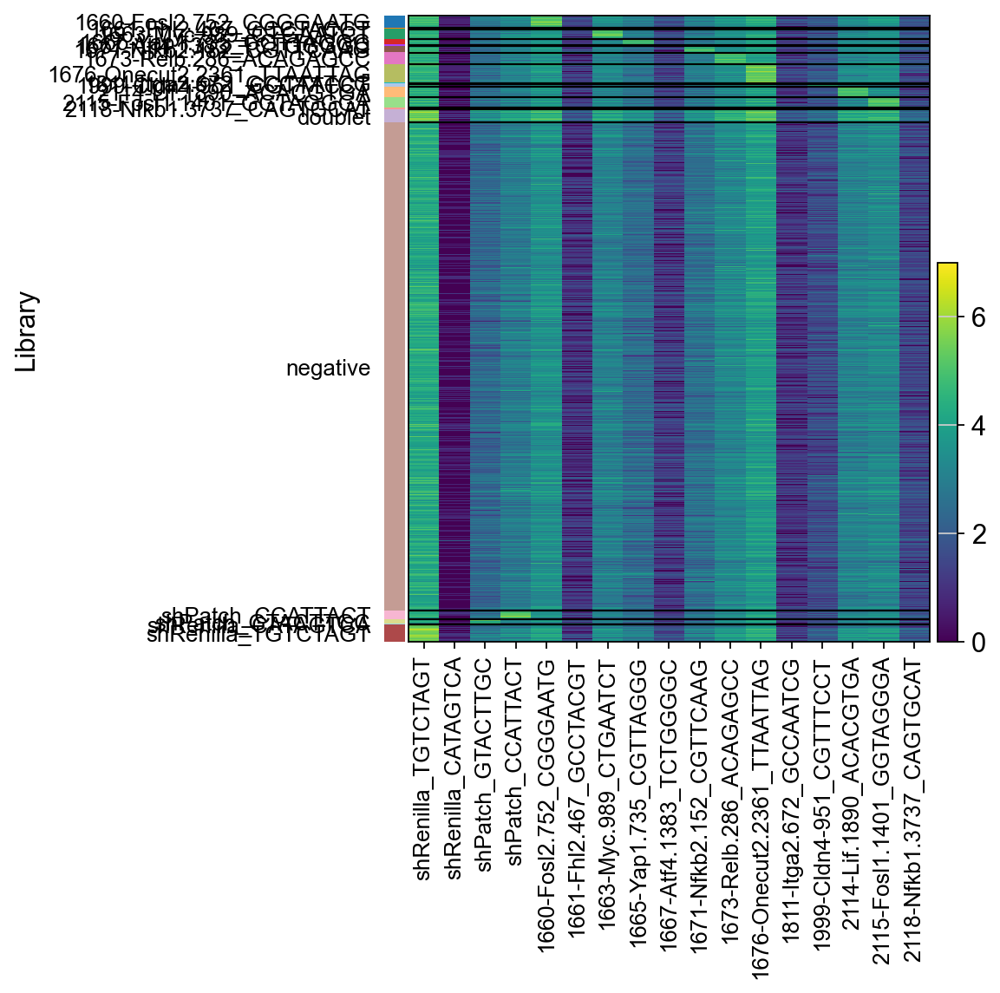

In [60]:
#output visulaization of hashing
sc.pl.heatmap(adata_enriched, adata_enriched.var_names, groupby="Library", log=True)#, save = f"_{figName}_hash.png")

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored

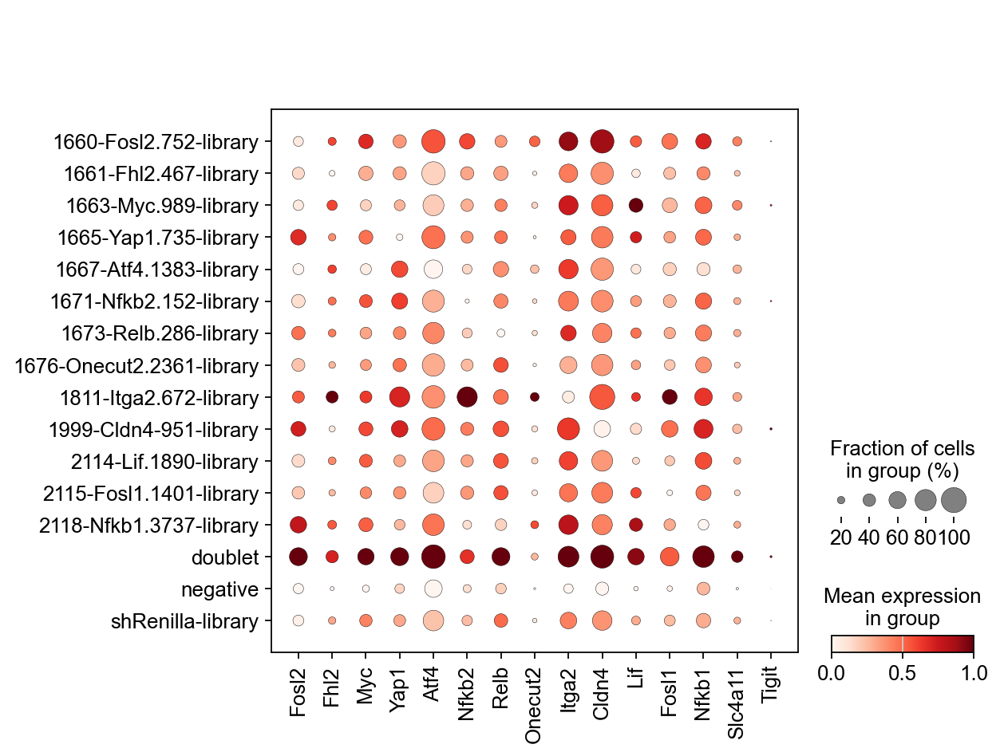

In [61]:
sc.pl.dotplot(adata, targetGenes, groupby='library_id', standard_scale='var')

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored

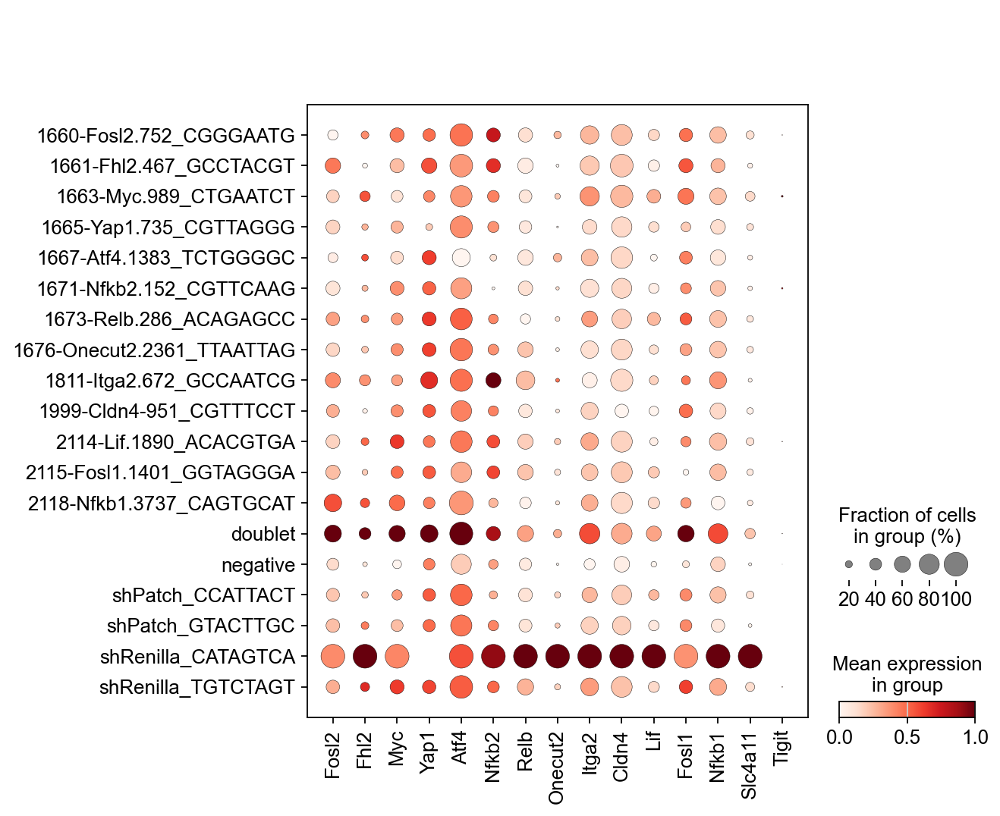

In [62]:
sc.pl.dotplot(adata, targetGenes, groupby='Library', standard_scale='var')

In [63]:
adata.obs.Library.value_counts()

Library
negative                      5878
1676-Onecut2.2361_TTAATTAG     223
shRenilla_TGTCTAGT             211
doublet                        156
1660-Fosl2.752_CGGGAATG        143
1673-Relb.286_ACAGAGCC         142
2115-Fosl1.1401_GGTAGGGA       128
2114-Lif.1890_ACACGTGA         125
1663-Myc.989_CTGAATCT          125
shPatch_CCATTACT                99
1671-Nfkb2.152_CGTTCAAG         80
1665-Yap1.735_CGTTAGGG          63
shPatch_GTACTTGC                63
1999-Cldn4-951_CGTTTCCT         34
2118-Nfkb1.3737_CAGTGCAT        21
1661-Fhl2.467_GCCTACGT          16
1667-Atf4.1383_TCTGGGGC         16
1811-Itga2.672_GCCAATCG         11
shRenilla_CATAGTCA               1
Name: count, dtype: int64

In [64]:
adata.obs.library_id.value_counts()

library_id
negative                     9803
shRenilla-library             586
1676-Onecut2.2361-library     345
2115-Fosl1.1401-library       239
1673-Relb.286-library         213
2114-Lif.1890-library         161
1663-Myc.989-library          141
1671-Nfkb2.152-library         87
1660-Fosl2.752-library         72
1665-Yap1.735-library          66
doublet                        28
2118-Nfkb1.3737-library        28
1999-Cldn4-951-library         26
1661-Fhl2.467-library          21
1667-Atf4.1383-library         21
1811-Itga2.672-library          8
Name: count, dtype: int64

In [65]:
import re
m = re.compile("(.+\-|negative|doublet)")

In [66]:
i=0
for x, y in adata.obs[['library_id', 'Library']].iterrows():
    print(y)
    i+=1
    if i == 1: 
        library_id,Library = y
        print(library_id[:-8])
        break

library_id    negative
Library            NaN
Name: AAACCCAAGAGGTCAC-1, dtype: object



In [67]:
classification = np.empty(len(adata), dtype="object")
i=0
import re
m1 = re.compile("(.+\-library|negative|doublet)")
m2 = re.compile("(.+\_)|negative|doublet")
for x,y in adata.obs[['library_id', 'Library']].iterrows():
    library_id,Library = y
    m1match = m1.match(library_id)
    if pd.isna(Library): 
        if m1match.group(0)[-8:] == "-library":
            m1match = m1match.group(0)[:-8]
        else:
            m1match = m1match.group(0)
        classification[i] = m1match
    elif m1.match(library_id) and m2.match(Library):
        m2match = m2.match(Library)
        if m1match.group(0)[-8:] == "-library":
            m1match = m1match.group(0)[:-8]
        else:
            m1match = m1match.group(0)
        if m2match.group(0)[-1] == "_":
            m2match = m2match.group(0)[:-1]
        else:
            m2match = m2match.group(0)
        if m1match == m2match:
            classification[i] = m1match
        elif m1match == 'doublet' or m2match == 'doublet':
            classification[i] = 'doublet'
        elif m1match == 'negative':
            classification[i] = m2match
        elif m2match == 'negative':
            classification[i] = m1match
        else:
            classification[i] = 'mismatch'
    i += 1
adata.obs['cLibrary'] = classification

In [68]:
adata.obs.cLibrary.value_counts()

cLibrary
negative             9229
shRenilla             604
1676-Onecut2.2361     376
1673-Relb.286         242
2115-Fosl1.1401       241
2114-Lif.1890         177
1663-Myc.989          169
doublet               169
shPatch               162
1660-Fosl2.752        162
1671-Nfkb2.152        108
1665-Yap1.735          85
1999-Cldn4-951         37
2118-Nfkb1.3737        27
1661-Fhl2.467          23
1667-Atf4.1383         21
1811-Itga2.672         11
mismatch                2
Name: count, dtype: int64

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored

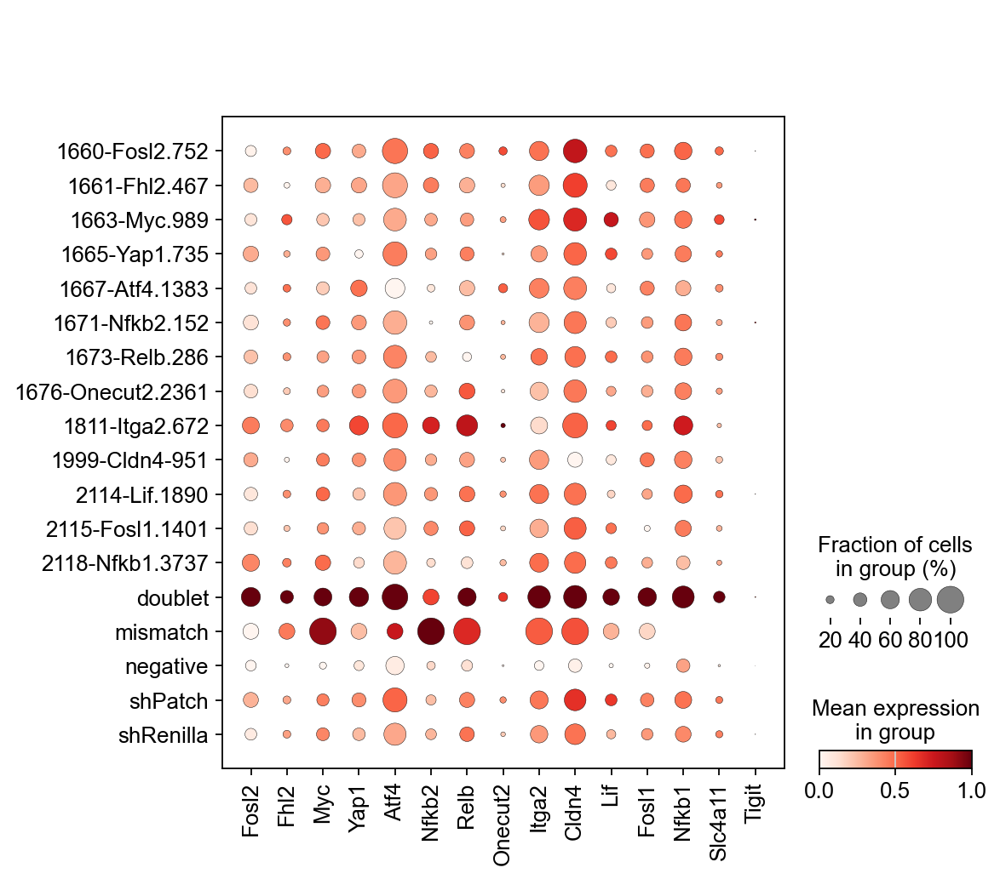

In [69]:
sc.pl.dotplot(adata, targetGenes, groupby='cLibrary', standard_scale='var')

## Set highly variable genes

In [70]:
adata = adata[~(adata.obs['Classification'].isin(['doublet','negative'])|adata.obs['library_id'].isin(['doublet'])),:]

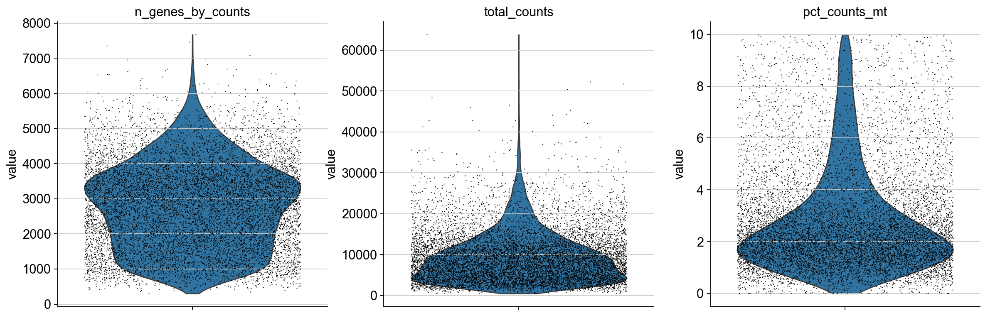

In [71]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, rotation=90)

In [72]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Logarithmize the data:

In [73]:
sc.pp.log1p(adata)

In [74]:
sc.pp.highly_variable_genes(adata) #batch_key=Classification

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


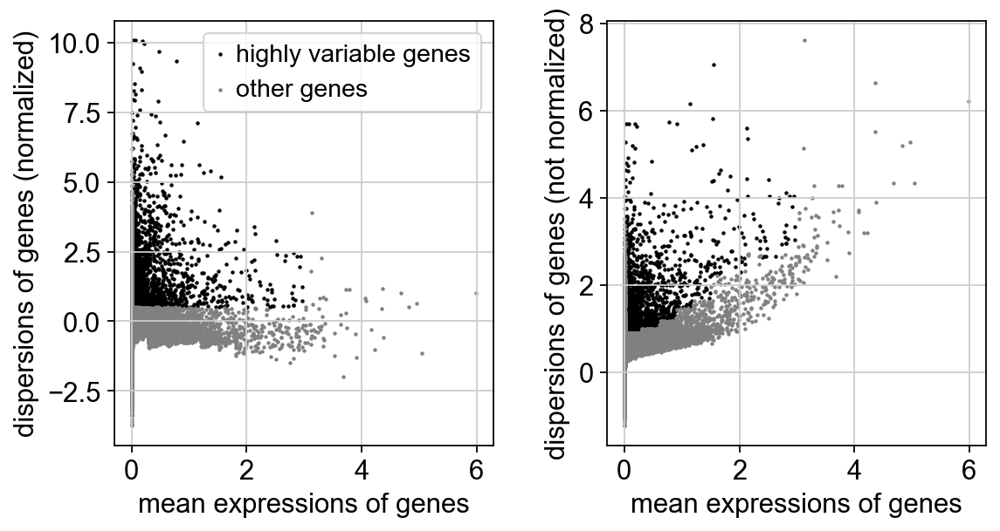

In [75]:
sc.pl.highly_variable_genes(adata)

In [76]:
#Ensure marker genes aren't making an impact to highly variable gene analysis downstream
adata.var.highly_variable['GFP'] = False
adata.var.highly_variable['mKate2'] = False
adata.var.highly_variable['Cre'] = False
for x in library:
    adata.var.highly_variable[x] = False

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/2494002207.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.var.highly_variable['GFP'] = False
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/2494002

In [77]:
adata.obs['library_id'].value_counts()

library_id
negative                     8589
shRenilla-library             515
1676-Onecut2.2361-library     316
2115-Fosl1.1401-library       202
1673-Relb.286-library         182
2114-Lif.1890-library         140
1663-Myc.989-library          115
1671-Nfkb2.152-library         82
1660-Fosl2.752-library         64
1665-Yap1.735-library          63
2118-Nfkb1.3737-library        24
1999-Cldn4-951-library         22
1661-Fhl2.467-library          19
1667-Atf4.1383-library         18
1811-Itga2.672-library          6
Name: count, dtype: int64

In [78]:
#Set shRNA groups
adata.obs['shRNA'] = None
for x in adata.obs["library_id"].cat.categories:
    if x == 'negative':continue
    adata.obs['shRNA'][adata[adata.obs['library_id'].isin([x]),:].obs.index] = x

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/2310838860.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.obs['shRNA'][adata[adata.obs['library_id'].isin([x]),:].obs.index] = x
/var/folders/xc/wjwqs2j55dqgp2ghrn6n

In [79]:
adata.obs[['Classification','shRNA']].value_counts()

Classification  shRNA                    
AM1073_B0302    shRenilla-library            169
AN1975_B0306    shRenilla-library            138
AO1372_B0305    shRenilla-library            129
AM1062_B0301    1676-Onecut2.2361-library    109
AN1975_B0306    1676-Onecut2.2361-library     89
AM1073_B0302    2114-Lif.1890-library         81
                2115-Fosl1.1401-library       81
                1671-Nfkb2.152-library        78
                1673-Relb.286-library         75
AM1062_B0301    2115-Fosl1.1401-library       73
AM1073_B0302    1676-Onecut2.2361-library     69
                1665-Yap1.735-library         50
AM1062_B0301    1673-Relb.286-library         48
AM1073_B0302    1663-Myc.989-library          46
AO1290_B0303    shRenilla-library             40
AM1062_B0301    shRenilla-library             34
AM1073_B0302    1660-Fosl2.752-library        32
AO1290_B0303    1663-Myc.989-library          32
AO1372_B0305    1673-Relb.286-library         27
AN1975_B0306    2114-Lif.18

In [80]:
sum(adata.obs[['Classification','shRNA']].value_counts())

1768

In [81]:
adata.raw = adata

In [82]:
adata.write('write/allmice-noSCT.h5ad', compression='gzip')

In [83]:
adata = sc.read('write/allmice-noSCT.h5ad')

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [84]:
adata = adata[:, adata.var.highly_variable]

In [85]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:16)


In [86]:
sc.pp.scale(adata, max_value=10)

## Principal component analysis

In [87]:
sc.tl.pca(adata, svd_solver='arpack', n_comps=100)

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:01)


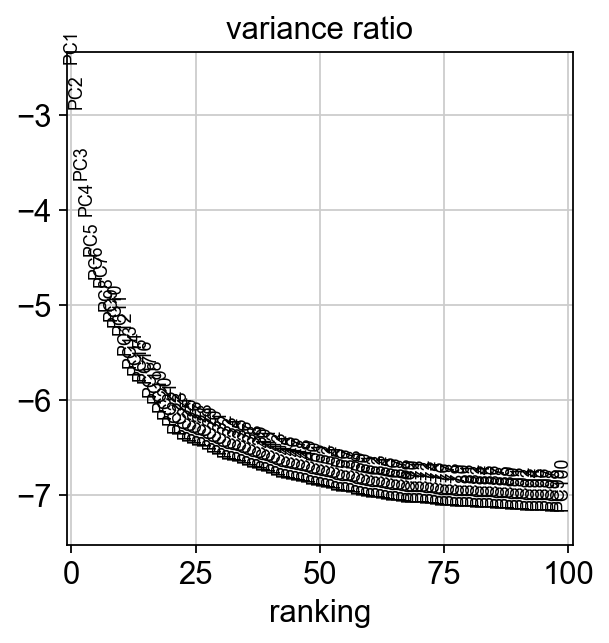

In [88]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=100)

Save the result.

In [89]:
adata.write(results_file, compression='gzip')

In [90]:
adata

AnnData object with n_obs × n_vars = 10357 × 2533
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', '1660-Fosl2.752-library', '1661-Fhl2.467-library', '1663-Myc.989-library', '1665-Yap1.735-library', '1667-Atf4.1383-library', '1671-Nfkb2.152-library', '1673-Relb.286-library', '1676-Onecut2.2361-library', '1811-Itga2.672-library', '1999-Cldn4-951-library', '2114-Lif.1890-library', '2115-Fosl1.1401-library', '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count', 'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

## Computing the neighborhood graph

In [91]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=75)

computing neighbors
    using 'X_pca' with n_pcs = 75
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:12)


## Embedding the neighborhood graph

In [92]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


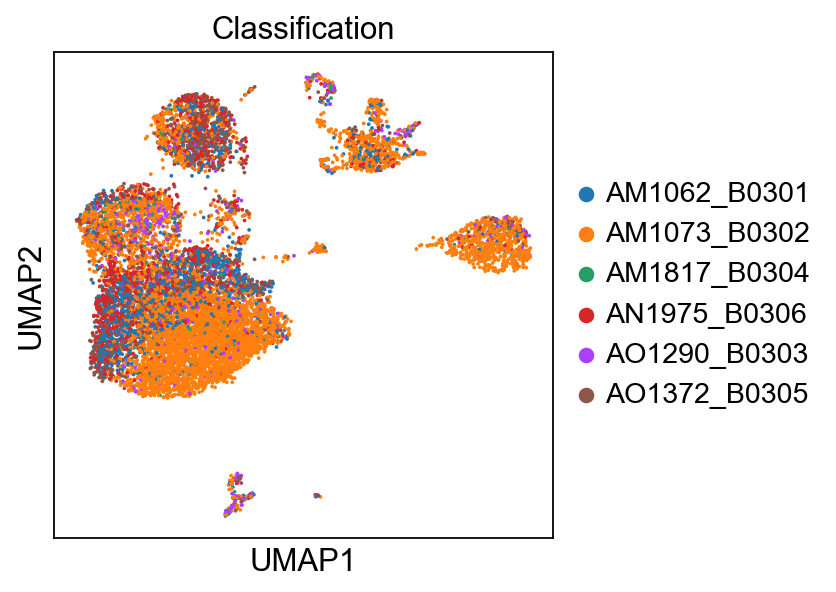

In [93]:
sc.pl.umap(adata, color=['Classification'])

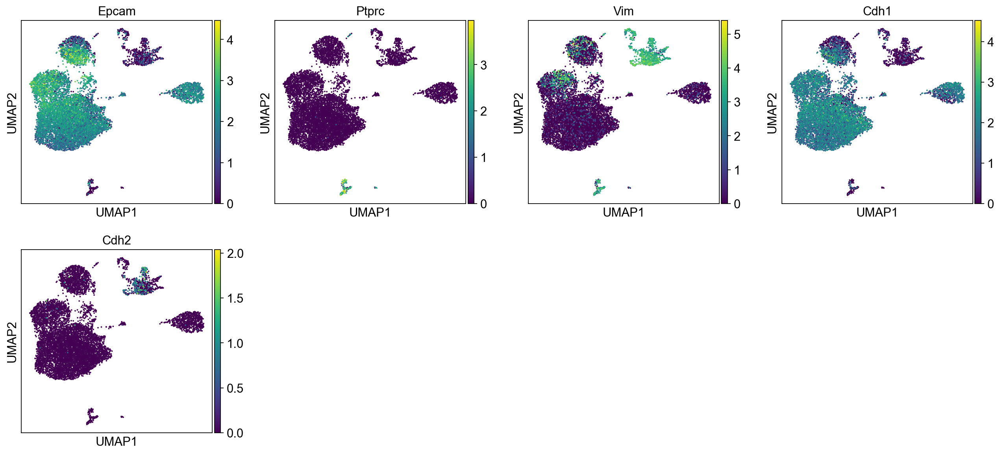

In [94]:
sc.pl.umap(adata, color=['Epcam', 'Ptprc','Vim', 'Cdh1','Cdh2'])

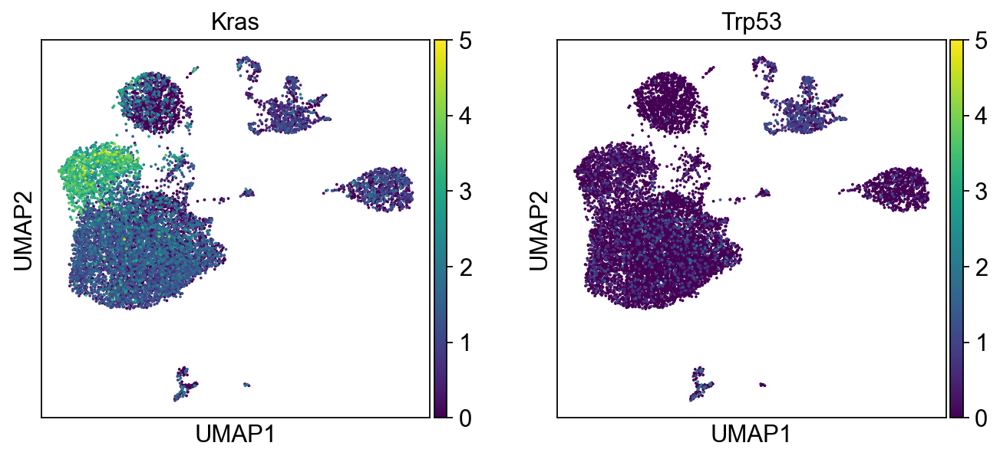

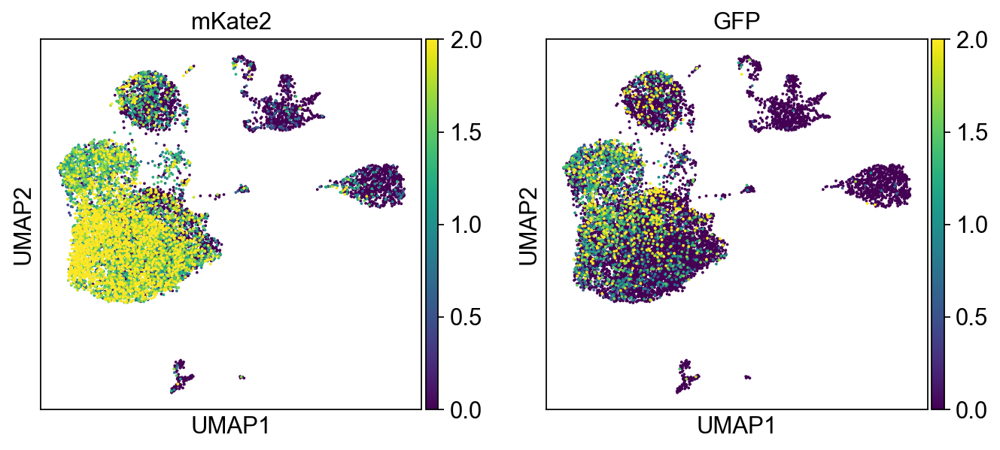

In [95]:
sc.pl.umap(adata, color=['Kras','Trp53'], vmax=5)
sc.pl.umap(adata, color=['mKate2','GFP'], vmax=2)

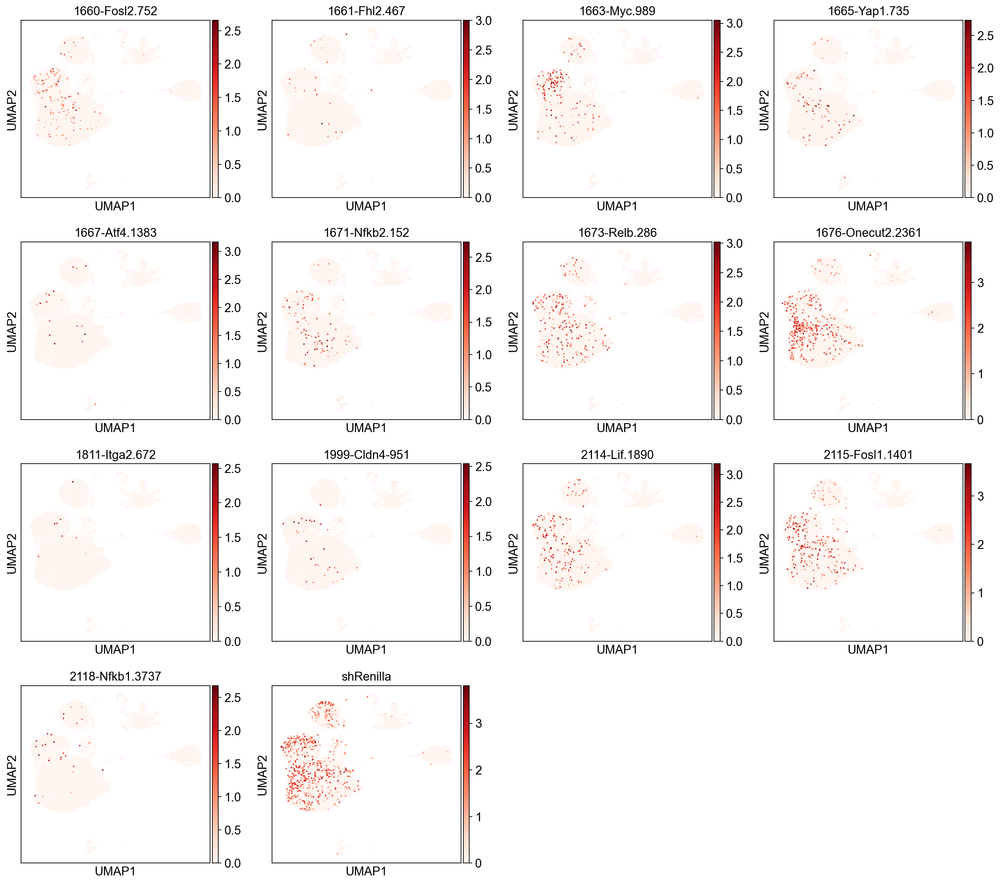

In [96]:
sc.pl.umap(adata, color=library, cmap='Reds')

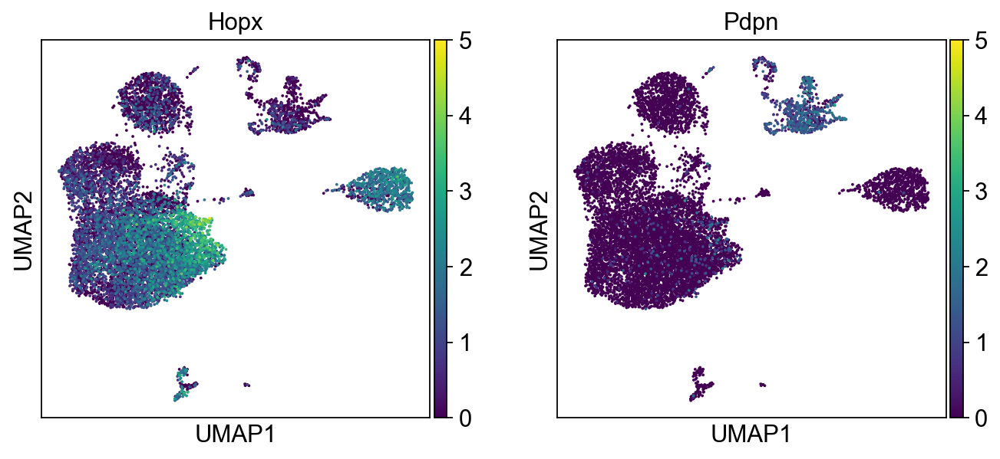

In [97]:
sc.pl.umap(adata, color=['Hopx','Pdpn'], vmax=5)

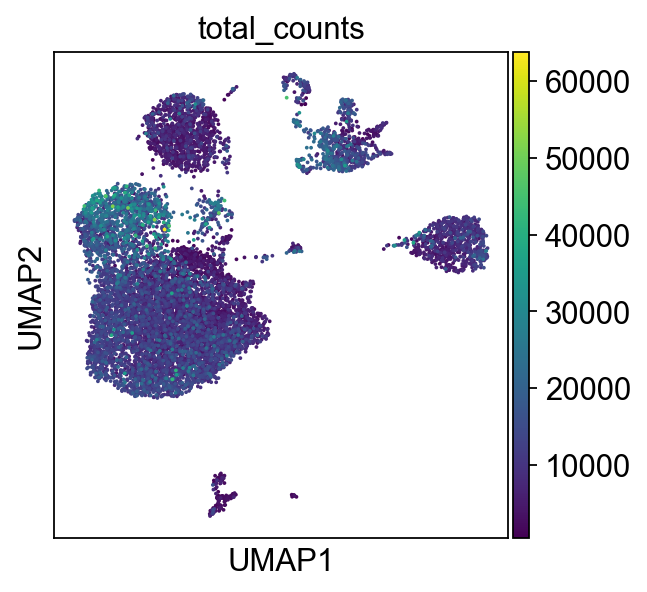

In [98]:
sc.pl.umap(adata, color=['total_counts'])

## Clustering the neighborhood graph

In [99]:
#sc.tl.leiden(adata, resolution=0.30)
sc.tl.leiden(adata, resolution=0.35)

running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


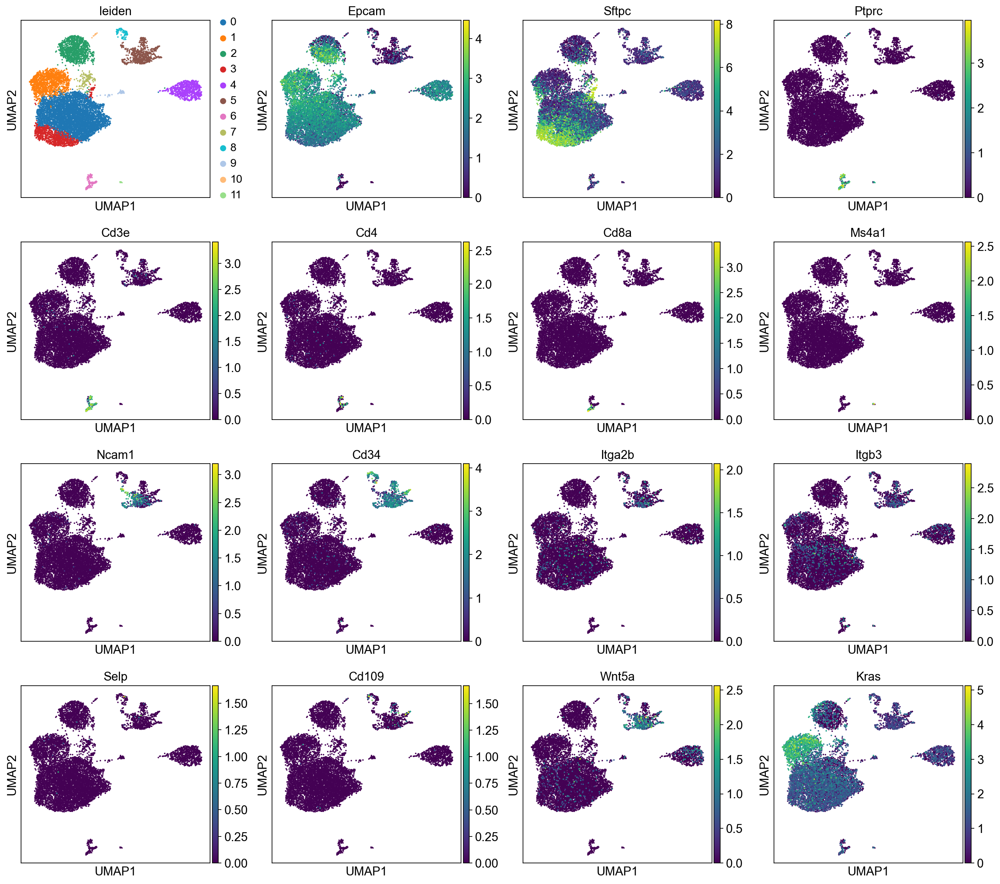

In [100]:
sc.pl.umap(adata, color=['leiden', 'Epcam', 'Sftpc', # Tumor cells
                         'Ptprc', #immune
                         'Cd3e', 'Cd4', 'Cd8a', #T cell
                          'Ms4a1', #'Cd22', # B cell 'Cd19',
                         #'Itgax', 'Il3ra', # Dendritic Cell
                         'Ncam1',# 'Ncr1', # NK Cell
                         'Cd34', # Hematopoetic stem cell
                         #'Cd14', 'Cd33', # macrophage
                         #'Ceacam8' # Granulocyte
                         'Itga2b', 'Itgb3', 'Selp', #platelet
                         #'Gypa',  # erythrocyte
                         #'Mcam', 'Vcam1', 'Pecam1', 'Sele', # endothelial cell
                         'Cd109', 'Wnt5a', 'Kras'])

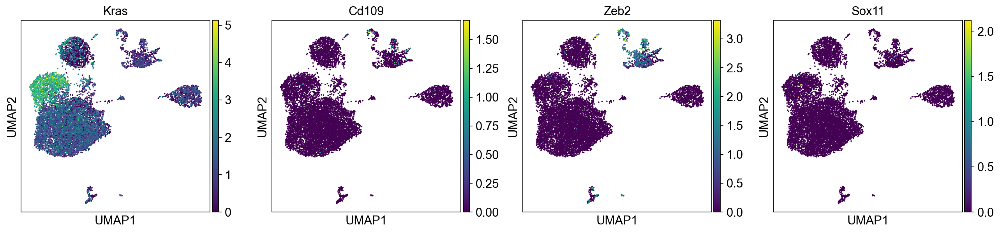

In [101]:
sc.pl.umap(adata, color=['Kras', 'Cd109', 'Zeb2', 'Sox11'])

Save the result.

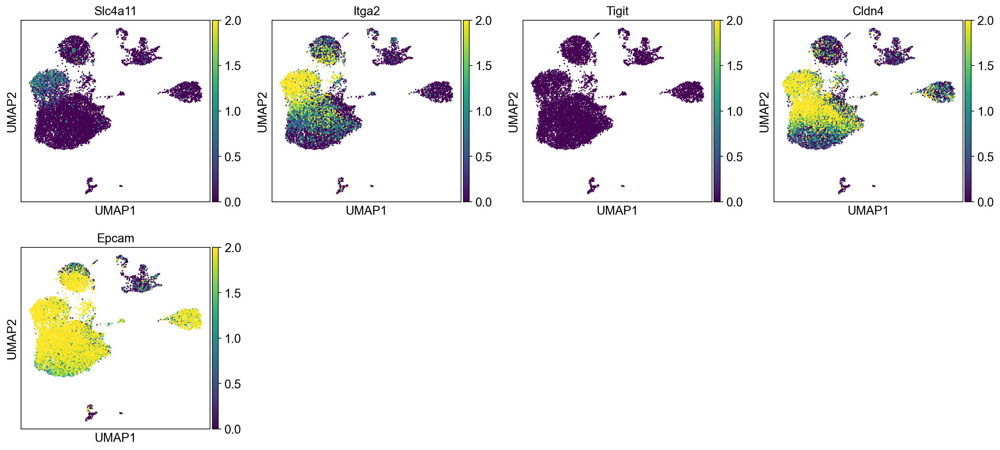

In [102]:
sc.pl.umap(adata, color=['Slc4a11', 'Itga2', 'Tigit', 'Cldn4','Epcam'], vmax=2)

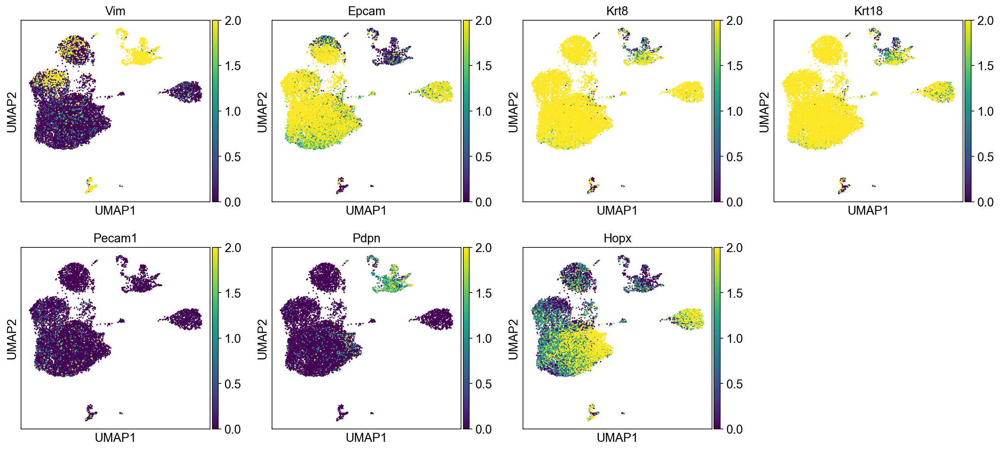

In [103]:
sc.pl.umap(adata, color=['Vim', 'Epcam', 'Krt8', 'Krt18','Pecam1', 'Pdpn', 'Hopx'], vmax=2)

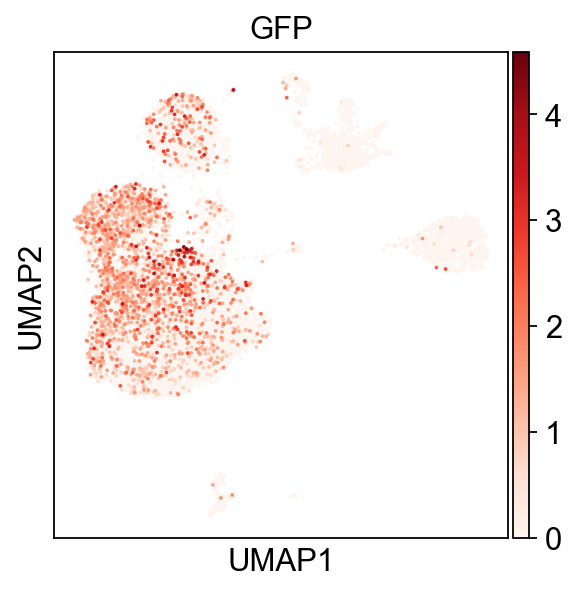

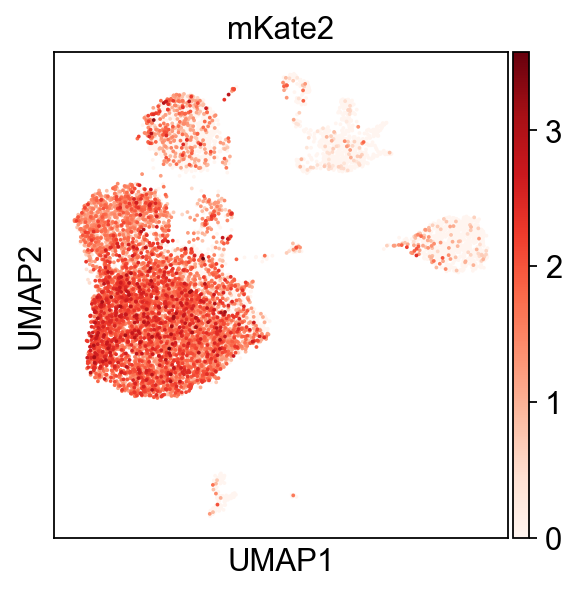

In [104]:
sc.pl.umap(adata, color=['GFP'], cmap='Reds')
sc.pl.umap(adata, color=['mKate2'], cmap='Reds')

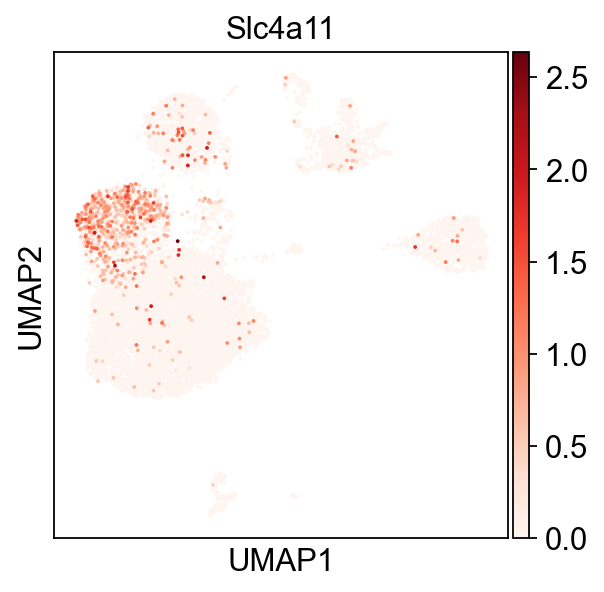

In [105]:
sc.pl.umap(adata, color=['Slc4a11'], cmap='Reds')

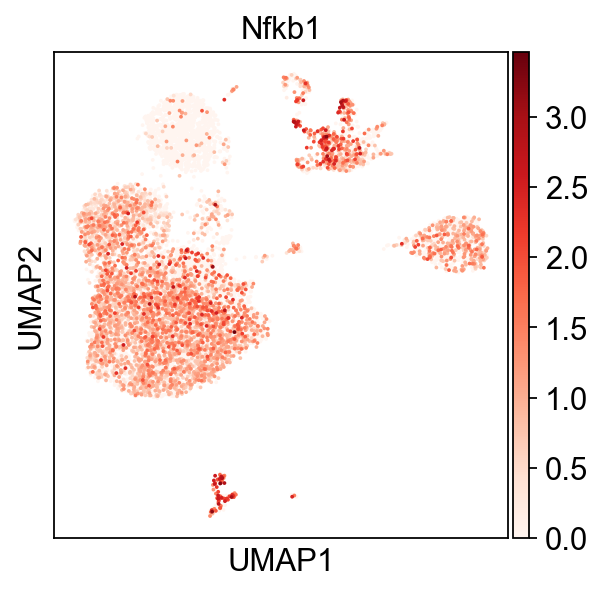

In [106]:
sc.pl.umap(adata, color=['Nfkb1'], cmap='Reds')

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


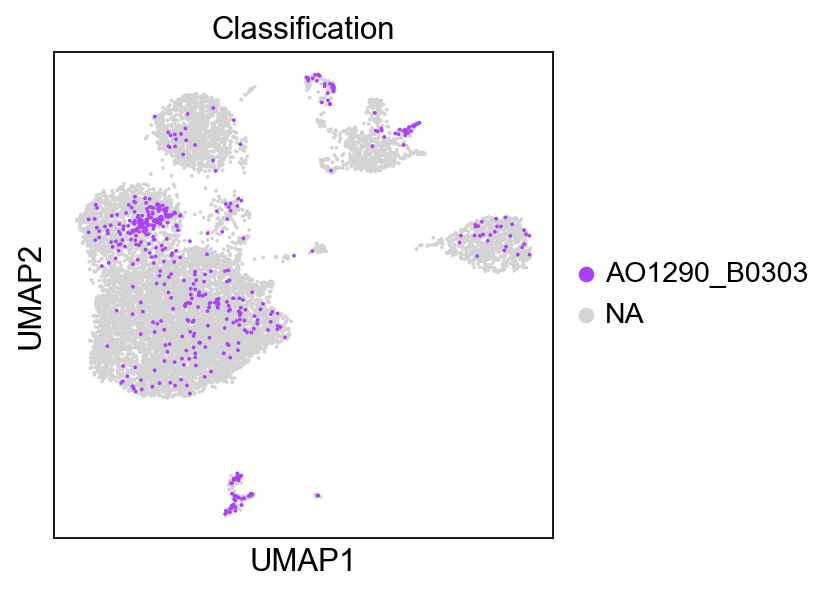

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


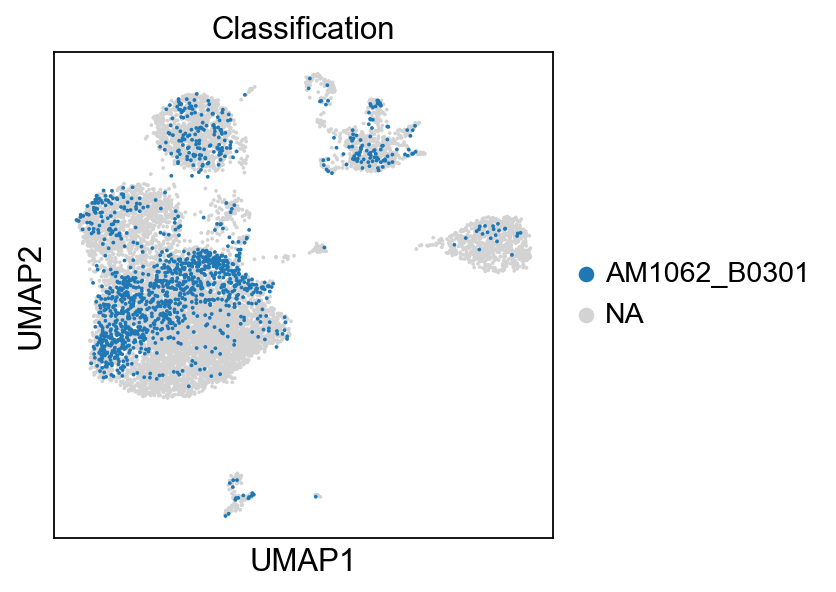

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


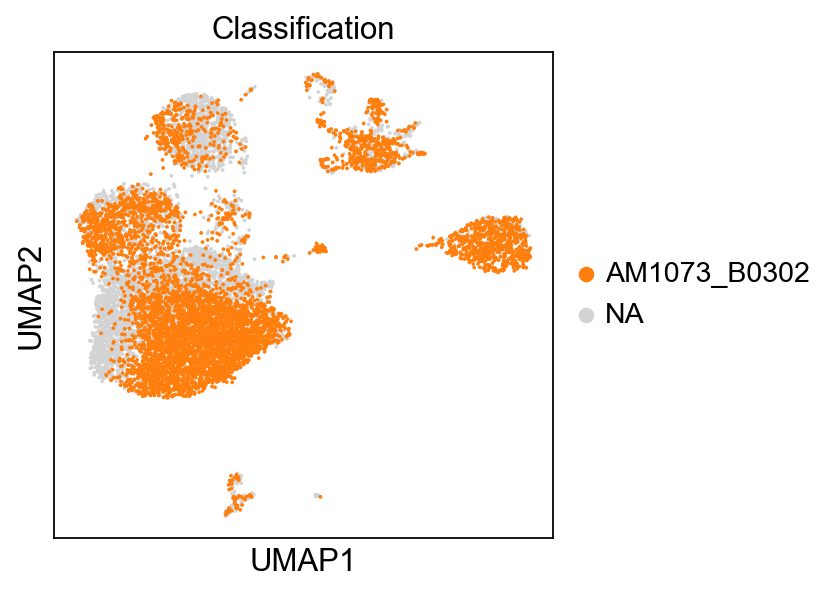

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


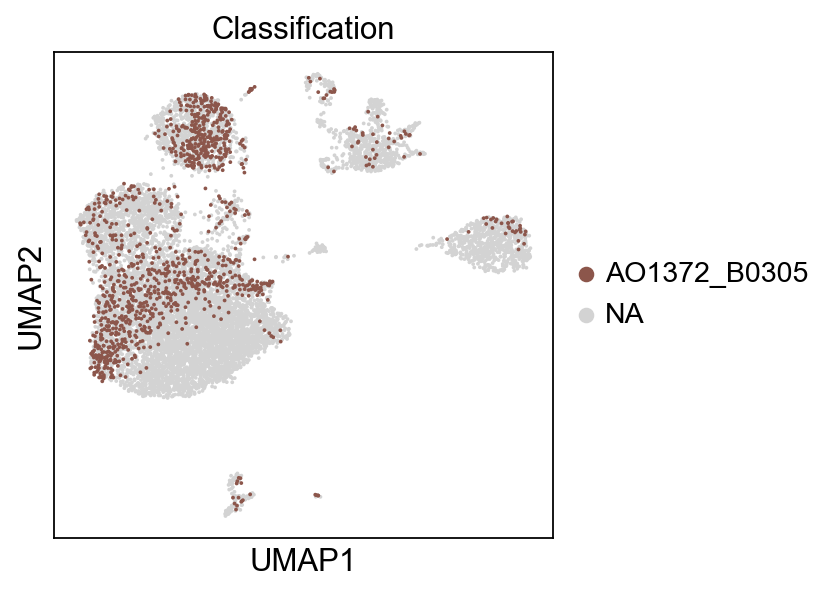

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


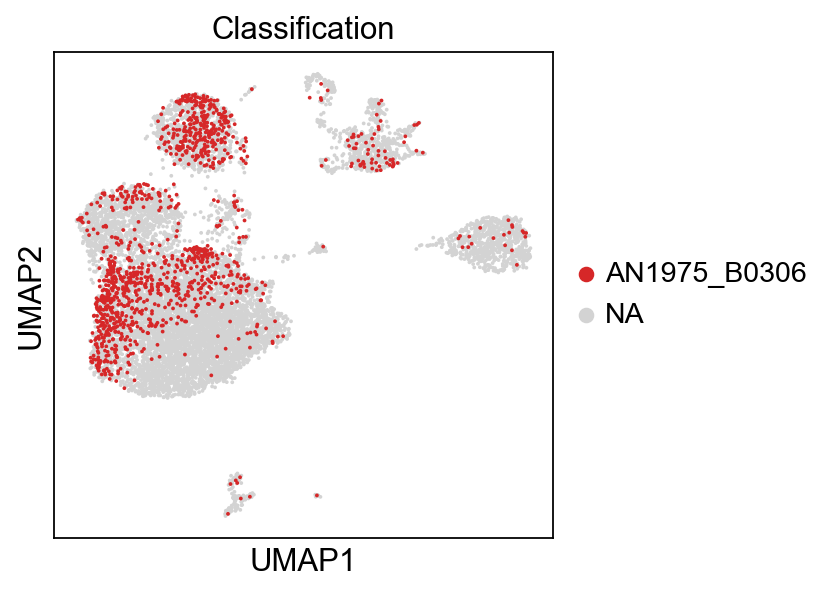

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


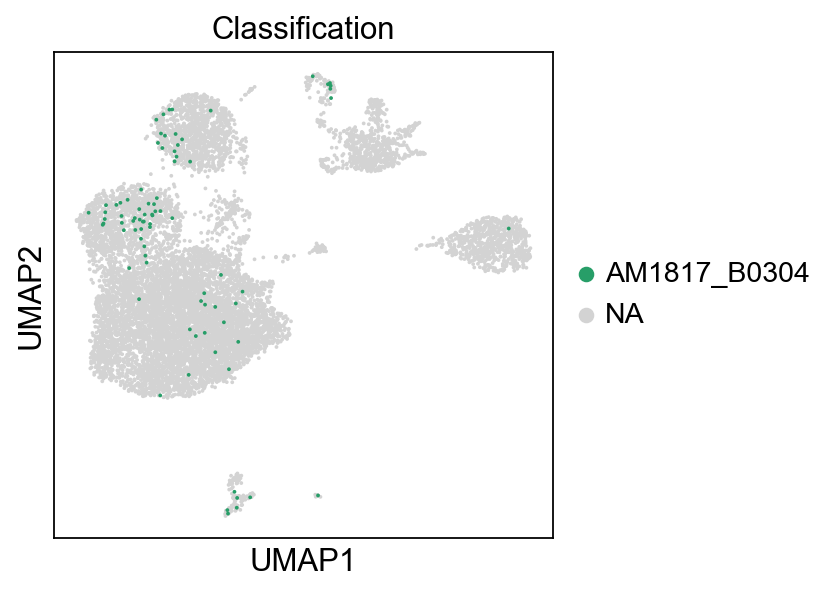

In [107]:
for label in adata.obs['Classification'].unique():
    sc.pl.umap(adata, color='Classification',groups=[label])

In [108]:
#fix a bug; 'base' is None but that doesn't seem to have transferred
adata.uns['log1p']['base'] = None

Cluster 1 appears to be fibroblasts based on Krt8 and Krt18 weak staining

In [109]:
adata.obs.keys()

Index(['n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt',
       'pct_counts_mt', 'log10GenesPerUMI', 'Classification',
       '1660-Fosl2.752-library', '1661-Fhl2.467-library',
       '1663-Myc.989-library', '1665-Yap1.735-library',
       '1667-Atf4.1383-library', '1671-Nfkb2.152-library',
       '1673-Relb.286-library', '1676-Onecut2.2361-library',
       '1811-Itga2.672-library', '1999-Cldn4-951-library',
       '2114-Lif.1890-library', '2115-Fosl1.1401-library',
       '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count',
       'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA', 'leiden'],
      dtype='object')

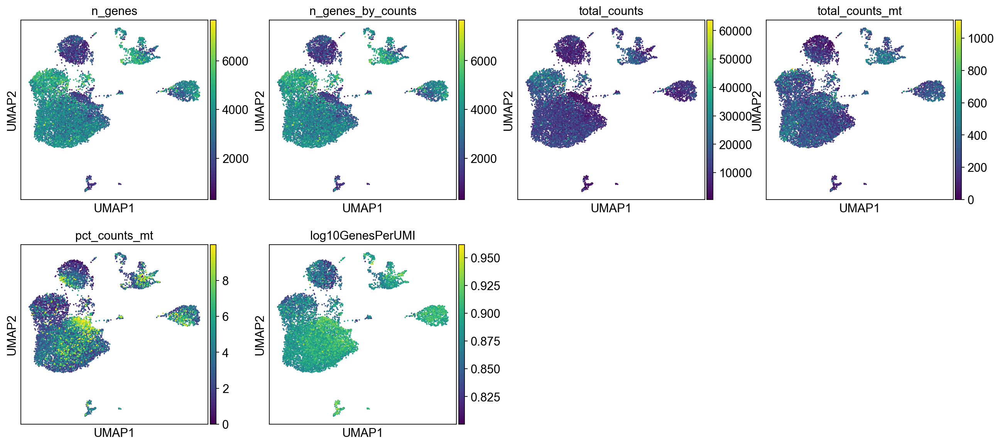

In [110]:
sc.pl.umap(adata,color=['n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt',
       'pct_counts_mt', 'log10GenesPerUMI'])

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


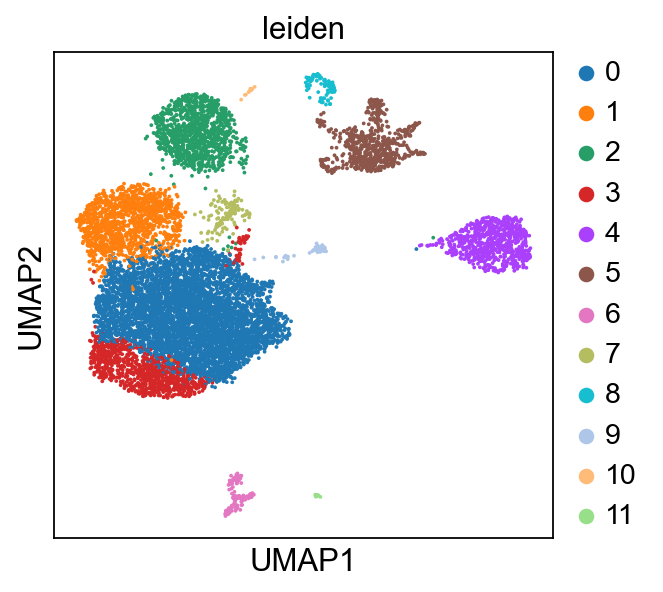

In [111]:
sc.pl.umap(adata,color='leiden')

In [112]:
adata

AnnData object with n_obs × n_vars = 10357 × 2533
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', '1660-Fosl2.752-library', '1661-Fhl2.467-library', '1663-Myc.989-library', '1665-Yap1.735-library', '1667-Atf4.1383-library', '1671-Nfkb2.152-library', '1673-Relb.286-library', '1676-Onecut2.2361-library', '1811-Itga2.672-library', '1999-Cldn4-951-library', '2114-Lif.1890-library', '2115-Fosl1.1401-library', '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count', 'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'umap', 'Classification_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'di

In [113]:
adata[adata.obs.leiden.isin(['0','1','2','3','7','9']),:]

View of AnnData object with n_obs × n_vars = 8711 × 2533
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', '1660-Fosl2.752-library', '1661-Fhl2.467-library', '1663-Myc.989-library', '1665-Yap1.735-library', '1667-Atf4.1383-library', '1671-Nfkb2.152-library', '1673-Relb.286-library', '1676-Onecut2.2361-library', '1811-Itga2.672-library', '1999-Cldn4-951-library', '2114-Lif.1890-library', '2115-Fosl1.1401-library', '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count', 'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'umap', 'Classification_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    ob

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


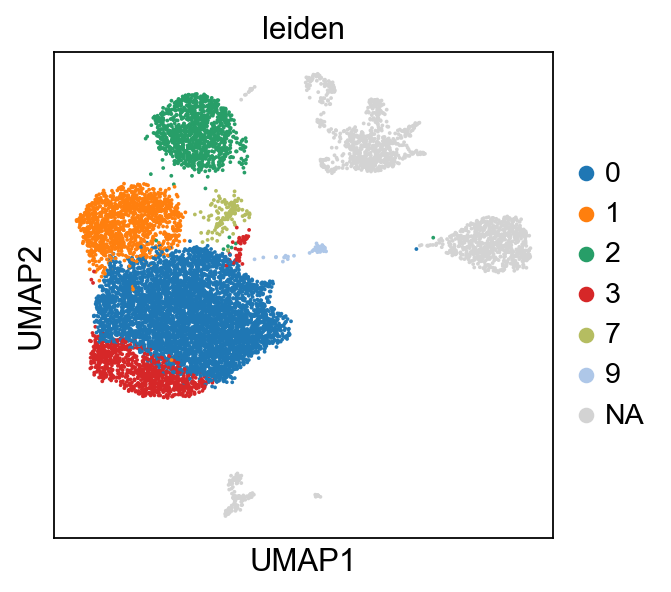

In [114]:
sc.pl.umap(adata, color=['leiden'], groups=['0','1','2','3','7','9']) # cluster 3 seems to be fibroblasts

## Select Tumor Cells

In [115]:
# Select only those subset of cells that are useful
adata2 = sc.read('write/allmice-noSCT.h5ad')
adata = adata2[adata.obs['leiden'].isin(['0','1','2','3','7','9']),:] # remove fibroblast cells
del adata2

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [116]:
#fix a bug; 'base' is None but that doesn't seem to have transferred
adata.uns['log1p']['base'] = None

In [117]:
sc.pp.highly_variable_genes(adata)#, batch_key='Classification')

extracting highly variable genes


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:553: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


In [118]:
#Ensure marker genes aren't making an impact to highly variable gene analysis downstream
adata.var.highly_variable['GFP'] = False
adata.var.highly_variable['mKate2'] = False
adata.var.highly_variable['Cre'] = False
for x in library:
    adata.var.highly_variable[x] = False

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/2494002207.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.var.highly_variable['GFP'] = False
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_36442/2494002

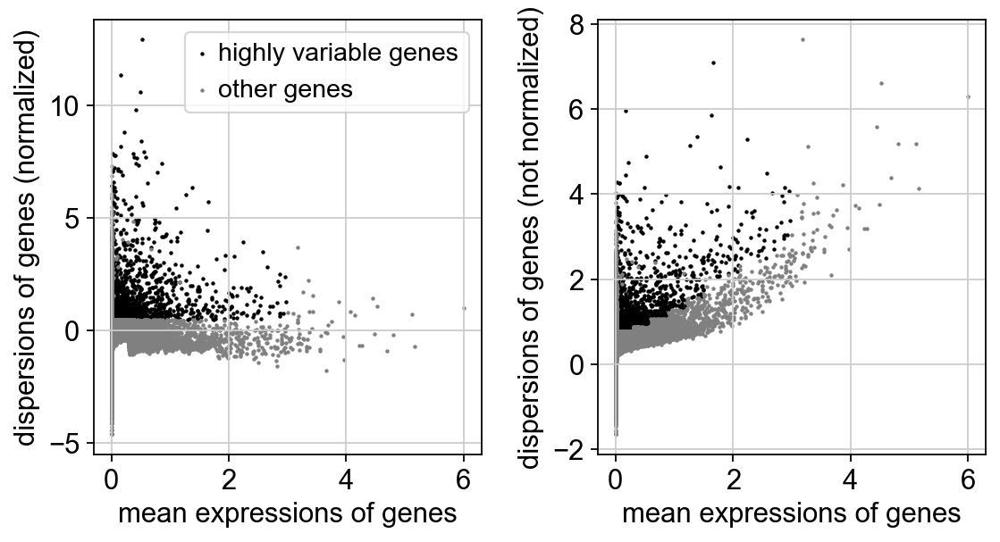

In [119]:
sc.pl.highly_variable_genes(adata)

In [120]:
adata.raw = adata

In [121]:
adata.write('write/allmice-tumornoSCT.h5ad', compression='gzip')
#adata = sc.read('write/allmice-tumornoSCT.h5ad')